In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split
from collections import Counter
import seaborn as sns
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Configuración de dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Usando dispositivo: {device}")

class ECGDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None, target_class=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
        
        # Filtrar solo la clase objetivo si se especifica
        if target_class:
            mask = [label == target_class for label in labels]
            self.image_paths = [path for path, m in zip(image_paths, mask) if m]
            self.labels = [label for label, m in zip(labels, mask) if m]
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        try:
            image = Image.open(image_path).convert('RGB')
        except Exception as e:
            print(f"Error cargando imagen {image_path}: {e}")
            # Crear imagen en blanco como fallback
            image = Image.new('RGB', (64, 64), color='white')  # Tamaño reducido para pruebas
        
        if self.transform:
            image = self.transform(image)
            
        return image, self.labels[idx]

# Generador simplificado para pruebas rápidas
class SimplifiedGenerator(nn.Module):
    def __init__(self, latent_dim=64, img_channels=3, img_size=64):  # Reducido
        super(SimplifiedGenerator, self).__init__()
        self.img_size = img_size
        self.img_channels = img_channels
        
        # Tamaño inicial más pequeño
        self.init_size = img_size // 8  # 8x8 para img_size=64
        self.l1 = nn.Sequential(nn.Linear(latent_dim, 128 * self.init_size ** 2))  # Reducido
        
        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2),  # 16x16
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),  # 32x32
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),  # 64x64
            nn.Conv2d(64, img_channels, 3, stride=1, padding=1),
            nn.Tanh(),
        )
    
    def forward(self, z):
        out = self.l1(z)
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

# Discriminador simplificado para pruebas rápidas
class SimplifiedDiscriminator(nn.Module):
    def __init__(self, img_channels=3, img_size=64):  # Reducido
        super(SimplifiedDiscriminator, self).__init__()
        
        def discriminator_block(in_filters, out_filters, bn=True):
            block = [nn.Conv2d(in_filters, out_filters, 3, 2, 1), nn.LeakyReLU(0.2, inplace=True)]
            if bn:
                block.append(nn.BatchNorm2d(out_filters, 0.8))
            return block
        
        self.model = nn.Sequential(
            *discriminator_block(img_channels, 32, bn=False),  # Reducido
            *discriminator_block(32, 64),
            *discriminator_block(64, 128),
        )
        
        # Calcular el tamaño del tensor después de las convoluciones
        ds_size = img_size // 2 ** 3  # 3 capas de downsampling
        self.adv_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2, 1), nn.Sigmoid())
    
    def forward(self, img):
        out = self.model(img)
        out = out.view(out.shape[0], -1)
        validity = self.adv_layer(out)
        return validity

class FastGANTrainer:
    def __init__(self, latent_dim=64, img_size=64, lr=0.001, b1=0.5, b2=0.999):  # LR más alto para convergencia rápida
        self.latent_dim = latent_dim
        self.img_size = img_size
        
        # Inicializar modelos
        self.generator = SimplifiedGenerator(latent_dim, 3, img_size).to(device)
        self.discriminator = SimplifiedDiscriminator(3, img_size).to(device)
        
        # Optimizadores
        self.optimizer_G = optim.Adam(self.generator.parameters(), lr=lr, betas=(b1, b2))
        self.optimizer_D = optim.Adam(self.discriminator.parameters(), lr=lr, betas=(b1, b2))
        
        # Loss function
        self.adversarial_loss = nn.BCELoss()
        
        # Para tracking de pérdidas
        self.g_losses = []
        self.d_losses = []
    
    def train(self, dataloader, epochs=20):  # Pocas épocas para prueba rápida
        """Entrena la GAN con configuración optimizada para pruebas"""
        print(f"Entrenando GAN por {epochs} épocas...")
        print(f"Tamaño del batch: {dataloader.batch_size}")
        print(f"Número de batches por época: {len(dataloader)}")
        
        # Inicializar pesos
        def weights_init(m):
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
        
        self.generator.apply(weights_init)
        self.discriminator.apply(weights_init)
        
        for epoch in range(epochs):
            epoch_g_losses = []
            epoch_d_losses = []
            
            progress_bar = tqdm(enumerate(dataloader), total=len(dataloader), desc=f'Época {epoch+1}/{epochs}')
            
            for i, (imgs, _) in progress_bar:
                batch_size = imgs.shape[0]
                
                # Adversarial ground truths
                valid = torch.ones(batch_size, 1, device=device, requires_grad=False)
                fake = torch.zeros(batch_size, 1, device=device, requires_grad=False)
                
                real_imgs = imgs.to(device)
                
                # ---------------------
                #  Train Discriminator
                # ---------------------
                self.optimizer_D.zero_grad()
                
                # Loss con imágenes reales
                real_loss = self.adversarial_loss(self.discriminator(real_imgs), valid)
                
                # Loss con imágenes falsas
                z = torch.randn(batch_size, self.latent_dim, device=device)
                gen_imgs = self.generator(z).detach()
                fake_loss = self.adversarial_loss(self.discriminator(gen_imgs), fake)
                
                d_loss = (real_loss + fake_loss) / 2
                d_loss.backward()
                self.optimizer_D.step()
                
                # -----------------
                #  Train Generator
                # -----------------
                self.optimizer_G.zero_grad()
                
                z = torch.randn(batch_size, self.latent_dim, device=device)
                gen_imgs = self.generator(z)
                
                # Loss: Generator quiere que discriminator clasifique como real
                g_loss = self.adversarial_loss(self.discriminator(gen_imgs), valid)
                g_loss.backward()
                self.optimizer_G.step()
                
                epoch_g_losses.append(g_loss.item())
                epoch_d_losses.append(d_loss.item())
                
                # Actualizar barra de progreso
                progress_bar.set_postfix({
                    'D_loss': f'{d_loss.item():.4f}',
                    'G_loss': f'{g_loss.item():.4f}'
                })
            
            # Promediar pérdidas de la época
            avg_g_loss = np.mean(epoch_g_losses)
            avg_d_loss = np.mean(epoch_d_losses)
            
            self.g_losses.append(avg_g_loss)
            self.d_losses.append(avg_d_loss)
            
            print(f"Época {epoch+1}/{epochs} - D loss: {avg_d_loss:.4f} - G loss: {avg_g_loss:.4f}")
            
            # Mostrar imágenes cada 5 épocas
            if (epoch + 1) % 5 == 0:
                self.sample_images(epoch)
    
    def sample_images(self, epoch, n_samples=9):
        """Genera y muestra imágenes de muestra durante el entrenamiento"""
        self.generator.eval()
        
        with torch.no_grad():
            z = torch.randn(n_samples, self.latent_dim, device=device)
            gen_imgs = self.generator(z)
            
            # Desnormalizar imágenes
            gen_imgs = (gen_imgs + 1) / 2
            
            # Crear grid de imágenes
            fig, axes = plt.subplots(3, 3, figsize=(9, 9))
            for i in range(n_samples):
                row, col = i // 3, i % 3
                img = gen_imgs[i].cpu().permute(1, 2, 0).numpy()
                axes[row, col].imshow(img)
                axes[row, col].axis('off')
            
            plt.suptitle(f'Imágenes Generadas - Época {epoch+1}')
            plt.tight_layout()
            
            # Crear directorio si no existe
            os.makedirs('quick_test_samples', exist_ok=True)
            plt.savefig(f'quick_test_samples/epoca_{epoch+1}.png', dpi=150, bbox_inches='tight')
            plt.show()
        
        self.generator.train()
    
    def generate_test_images(self, n_images=50):
        """Genera imágenes de prueba después del entrenamiento"""
        self.generator.eval()
        synthetic_images = []
        
        print(f"Generando {n_images} imágenes de prueba...")
        
        with torch.no_grad():
            for i in tqdm(range(n_images)):
                z = torch.randn(1, self.latent_dim, device=device)
                gen_img = self.generator(z)
                
                # Desnormalizar
                gen_img = (gen_img + 1) / 2
                gen_img = gen_img.cpu().squeeze().permute(1, 2, 0).numpy()
                
                # Convertir a rango 0-255
                gen_img = (gen_img * 255).astype(np.uint8)
                synthetic_images.append(gen_img)
        
        self.generator.train()
        return synthetic_images
    
    def plot_training_losses(self):
        """Visualiza las pérdidas del entrenamiento"""
        plt.figure(figsize=(12, 5))
        
        plt.subplot(1, 2, 1)
        plt.plot(self.g_losses, label='Generator Loss', color='blue', alpha=0.7)
        plt.plot(self.d_losses, label='Discriminator Loss', color='red', alpha=0.7)
        plt.title('Pérdidas durante el Entrenamiento')
        plt.xlabel('Época')
        plt.ylabel('Pérdida')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Pérdidas suavizadas si hay suficientes datos
        if len(self.g_losses) > 5:
            window = min(5, len(self.g_losses) // 2)
            g_smooth = np.convolve(self.g_losses, np.ones(window)/window, mode='valid')
            d_smooth = np.convolve(self.d_losses, np.ones(window)/window, mode='valid')
            epochs_smooth = range(window-1, len(self.g_losses))
            
            plt.subplot(1, 2, 2)
            plt.plot(epochs_smooth, g_smooth, label='Generator (Suavizada)', color='blue')
            plt.plot(epochs_smooth, d_smooth, label='Discriminator (Suavizada)', color='red')
            plt.title('Pérdidas Suavizadas')
            plt.xlabel('Época')
            plt.ylabel('Pérdida')
            plt.legend()
            plt.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.savefig('training_losses_quick_test.png', dpi=150, bbox_inches='tight')
        plt.show()

def load_ecg_dataset_sample(data_path, sample_size=500):
    """Carga solo una muestra del dataset para pruebas rápidas"""
    image_paths = []
    labels = []
    
    # Solo cargar clase F para la prueba
    class_name = 'F'
    class_dir = os.path.join(data_path, class_name)
    
    if os.path.exists(class_dir):
        print(f"Cargando muestra de clase {class_name} desde {class_dir}")
        class_images = []
        for filename in os.listdir(class_dir):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                full_path = os.path.join(class_dir, filename)
                class_images.append(full_path)
                
                # Limitar el número de imágenes para prueba rápida
                if len(class_images) >= sample_size:
                    break
        
        image_paths.extend(class_images)
        labels.extend([class_name] * len(class_images))
        print(f"  Cargadas {len(class_images)} imágenes para prueba")
    else:
        print(f"Error: Directorio no encontrado: {class_dir}")
        return [], []
    
    return image_paths, labels

def create_fast_transform():
    """Crea transformaciones optimizadas para pruebas rápidas"""
    return transforms.Compose([
        transforms.Resize((64, 64)),  # Tamaño reducido
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalizar a [-1, 1]
    ])

def split_dataset_70_30(image_paths, labels):
    """Divide el dataset en 70% train y 30% test"""
    print("Dividiendo dataset: 70% train, 30% test")
    
    X_train, X_test, y_train, y_test = train_test_split(
        image_paths, labels, 
        test_size=0.3,  # 30% para test
        train_size=0.7,  # 70% para train
        random_state=42,
        stratify=labels  # Mantener proporción de clases
    )
    
    print(f"Train: {len(X_train)} imágenes ({len(X_train)/len(image_paths)*100:.1f}%)")
    print(f"Test: {len(X_test)} imágenes ({len(X_test)/len(image_paths)*100:.1f}%)")
    
    return X_train, X_test, y_train, y_test

def save_test_images(synthetic_images, output_dir='test_generated_images'):
    """Guarda las imágenes de prueba generadas"""
    os.makedirs(output_dir, exist_ok=True)
    
    print(f"Guardando {len(synthetic_images)} imágenes de prueba...")
    
    for i, img in enumerate(tqdm(synthetic_images, desc="Guardando")):
        img_pil = Image.fromarray(img)
        img_pil.save(os.path.join(output_dir, f'synthetic_F_{i:03d}.png'))
    
    print(f"Imágenes guardadas en {output_dir}/")

def show_results_comparison(original_images, synthetic_images, n_show=6):
    """Compara imágenes originales vs sintéticas"""
    fig, axes = plt.subplots(2, n_show, figsize=(15, 6))
    
    # Mostrar imágenes originales
    for i in range(n_show):
        if i < len(original_images):
            try:
                img = Image.open(original_images[i]).resize((64, 64))
                axes[0, i].imshow(img)
                axes[0, i].set_title('Original')
                axes[0, i].axis('off')
            except:
                axes[0, i].text(0.5, 0.5, 'Error', ha='center', va='center')
                axes[0, i].axis('off')
    
    # Mostrar imágenes sintéticas
    for i in range(n_show):
        if i < len(synthetic_images):
            axes[1, i].imshow(synthetic_images[i])
            axes[1, i].set_title('Sintética')
            axes[1, i].axis('off')
    
    plt.suptitle('Comparación: Imágenes Originales vs Sintéticas', fontsize=14)
    plt.tight_layout()
    plt.savefig('comparison_original_vs_synthetic.png', dpi=150, bbox_inches='tight')
    plt.show()

def quick_test_main():
    """Función principal optimizada para pruebas rápidas"""
    # CONFIGURACIÓN PARA PRUEBA RÁPIDA
    DATA_PATH = "ecg_image_data/train"  # Actualizar con tu ruta
    SAMPLE_SIZE = 500  # Solo 500 imágenes para prueba rápida
    BATCH_SIZE = 16    # Batch más pequeño
    EPOCHS = 15        # Pocas épocas
    LATENT_DIM = 64    # Dimensión reducida
    IMG_SIZE = 64      # Imagen más pequeña
    N_TEST_IMAGES = 50 # Pocas imágenes de prueba
    
    print("=== PRUEBA RÁPIDA DE GAN ECG ===")
    print(f"Configuración optimizada para velocidad:")
    print(f"  - Muestra de dataset: {SAMPLE_SIZE} imágenes")
    print(f"  - Tamaño de imagen: {IMG_SIZE}x{IMG_SIZE}")
    print(f"  - Épocas: {EPOCHS}")
    print(f"  - Batch size: {BATCH_SIZE}")
    print("-" * 50)
    
    # 1. Cargar muestra del dataset
    print("1. Cargando muestra del dataset...")
    image_paths, labels = load_ecg_dataset_sample(DATA_PATH, SAMPLE_SIZE)
    
    if len(image_paths) == 0:
        print("Error: No se pudieron cargar imágenes. Verifica la ruta del dataset.")
        return
    
    # 2. Dividir en train/test 70/30
    print("\n2. Dividiendo dataset 70/30...")
    X_train, X_test, y_train, y_test = split_dataset_70_30(image_paths, labels)
    
    # 3. Crear dataset y dataloader para entrenamiento
    print("\n3. Preparando datos de entrenamiento...")
    transform = create_fast_transform()
    train_dataset = ECGDataset(X_train, y_train, transform=transform, target_class='F')
    train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
    
    print(f"Dataset de entrenamiento: {len(train_dataset)} imágenes")
    print(f"Número de batches: {len(train_dataloader)}")
    
    # 4. Inicializar y entrenar GAN
    print("\n4. Inicializando GAN...")
    trainer = FastGANTrainer(latent_dim=LATENT_DIM, img_size=IMG_SIZE, lr=0.001)
    
    print("\n5. Entrenando GAN (esto debería ser mucho más rápido)...")
    trainer.train(train_dataloader, epochs=EPOCHS)
    
    # 6. Visualizar pérdidas
    print("\n6. Visualizando pérdidas de entrenamiento...")
    trainer.plot_training_losses()
    
    # 7. Generar imágenes de prueba
    print(f"\n7. Generando {N_TEST_IMAGES} imágenes de prueba...")
    synthetic_images = trainer.generate_test_images(N_TEST_IMAGES)
    
    # 8. Guardar imágenes generadas
    print("\n8. Guardando imágenes generadas...")
    save_test_images(synthetic_images)
    
    # 9. Mostrar comparación
    print("\n9. Mostrando comparación de resultados...")
    show_results_comparison(X_test[:6], synthetic_images[:6])
    
    # 10. Resumen y recomendaciones
    print("\n" + "="*50)
    print("PRUEBA COMPLETADA!")
    print("="*50)
    print("Archivos generados:")
    print("  - quick_test_samples/: Imágenes durante entrenamiento")
    print("  - test_generated_images/: Imágenes finales generadas")
    print("  - training_losses_quick_test.png: Gráfico de pérdidas")
    print("  - comparison_original_vs_synthetic.png: Comparación visual")
    
    print(f"\nRESULTADOS:")
    print(f"  - Tiempo de entrenamiento: Mucho más rápido")
    print(f"  - Imágenes generadas: {len(synthetic_images)}")
    print(f"  - Split aplicado: 70% train ({len(X_train)}), 30% test ({len(X_test)})")
    
    print(f"\nPRÓXIMOS PASOS:")
    print(f"  1. Si los resultados se ven bien, ajusta los parámetros para entrenamiento completo:")
    print(f"     - IMG_SIZE = 128 (o más)")
    print(f"     - EPOCHS = 100-300")
    print(f"     - SAMPLE_SIZE = sin límite (todo el dataset)")
    print(f"     - BATCH_SIZE = 32 o más")
    print(f"  2. Para dataset completo, usa el script original con estos ajustes")
    print("="*50)
    
    return trainer, synthetic_images



Usando dispositivo: cpu


In [6]:

# EJEMPLOS DE USO:

def scale_up_training(execute=False):
    """
    Configuración recomendada después de que la prueba funcione bien
    
    Args:
        execute (bool): Si True, ejecuta el entrenamiento completo con la nueva configuración
    """
    config = {
        'DATA_PATH': "ecg_image_data/train",  # Tu ruta
        'IMG_SIZE': 128,           # Tamaño completo
        'EPOCHS': 150,             # Más épocas para mejor calidad
        'BATCH_SIZE': 32,          # Batch más grande
        'LATENT_DIM': 100,         # Dimensión completa
        'SAMPLE_SIZE': None,       # Todo el dataset (sin límite)
        'LR': 0.005,             # Learning rate estándar para GANs
        'N_GENERATED': 1600        # Más imágenes para balanceamiento real
    }
    
    print("CONFIGURACIÓN RECOMENDADA PARA ENTRENAMIENTO COMPLETO:")
    print("-" * 60)
    for key, value in config.items():
        print(f"  {key}: {value}")
    print("-" * 60)
    
    if not execute:
        print("Para ejecutar con esta configuración, llama:")
        print("scale_up_training(execute=True)")
        return config
    
    # EJECUTAR ENTRENAMIENTO COMPLETO
    print("INICIANDO ENTRENAMIENTO COMPLETO...")
    
    # 1. Cargar dataset completo (sin límite de muestra)
    print("1. Cargando dataset completo...")
    image_paths, labels = load_ecg_dataset_complete(config['DATA_PATH'])
    
    if len(image_paths) == 0:
        print("Error: No se pudieron cargar imágenes.")
        return
    
    # 2. Dividir dataset
    print("2. Dividiendo dataset 70/30...")
    X_train, X_test, y_train, y_test = split_dataset_70_30(image_paths, labels)
    
    # 3. Crear transformaciones para tamaño completo
    transform = transforms.Compose([
        transforms.Resize((config['IMG_SIZE'], config['IMG_SIZE'])),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])
    
    # 4. Crear dataset y dataloader
    train_dataset = ECGDataset(X_train, y_train, transform=transform, target_class='F')
    train_dataloader = DataLoader(
        train_dataset, 
        batch_size=config['BATCH_SIZE'], 
        shuffle=True, 
        drop_last=True
    )
    
    print(f"Dataset de entrenamiento: {len(train_dataset)} imágenes")
    print(f"Número de batches: {len(train_dataloader)}")
    
    # 5. Crear modelos con configuración completa
    print("5. Inicializando GAN para entrenamiento completo...")
    trainer = FullGANTrainer(
        latent_dim=config['LATENT_DIM'], 
        img_size=config['IMG_SIZE'], 
        lr=config['LR']
    )
    
    # 6. Entrenar
    print(f"6. Entrenando por {config['EPOCHS']} épocas...")
    trainer.train(train_dataloader, epochs=config['EPOCHS'])
    
    # 7. Generar imágenes finales
    print(f"7. Generando {config['N_GENERATED']} imágenes finales...")
    synthetic_images = trainer.generate_test_images(config['N_GENERATED'])
    
    # 8. Guardar resultados
    save_test_images(synthetic_images, 'final_generated_images')
    trainer.plot_training_losses()
    
    print("ENTRENAMIENTO COMPLETO FINALIZADO!")

    # 9. Mostrando comparación de resultados
    print("\n9. Mostrando comparación de resultados...")
    show_results_comparison(X_test[:6], synthetic_images[:6])
    
    return trainer, synthetic_images, config

def load_ecg_dataset_complete(data_path):
    """Carga el dataset completo sin límite de muestras"""
    image_paths = []
    labels = []
    
    class_name = 'F'
    class_dir = os.path.join(data_path, class_name)
    
    if os.path.exists(class_dir):
        print(f"Cargando TODAS las imágenes de clase {class_name}...")
        for filename in os.listdir(class_dir):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                full_path = os.path.join(class_dir, filename)
                image_paths.append(full_path)
        
        labels.extend([class_name] * len(image_paths))
        print(f"  Cargadas {len(image_paths)} imágenes (dataset completo)")
    
    return image_paths, labels

class FullGANTrainer(FastGANTrainer):
    """Versión extendida del trainer para entrenamiento completo"""
    
    def __init__(self, latent_dim=100, img_size=128, lr=0.0002, b1=0.5, b2=0.999):
        # Usar generador y discriminador más grandes
        self.latent_dim = latent_dim
        self.img_size = img_size
        
        # Modelos más grandes para mejor calidad
        self.generator = FullGenerator(latent_dim, 3, img_size).to(device)
        self.discriminator = FullDiscriminator(3, img_size).to(device)
        
        # Optimizadores con LR estándar
        self.optimizer_G = optim.Adam(self.generator.parameters(), lr=lr, betas=(b1, b2))
        self.optimizer_D = optim.Adam(self.discriminator.parameters(), lr=lr, betas=(b1, b2))
        
        self.adversarial_loss = nn.BCELoss()
        self.g_losses = []
        self.d_losses = []

class FullGenerator(nn.Module):
    """Generador más grande para mejor calidad"""
    def __init__(self, latent_dim=100, img_channels=3, img_size=128):
        super(FullGenerator, self).__init__()
        self.img_size = img_size
        self.img_channels = img_channels
        
        self.init_size = img_size // 8  # 16x16 para img_size=128
        self.l1 = nn.Sequential(nn.Linear(latent_dim, 256 * self.init_size ** 2))
        
        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(256),
            nn.Upsample(scale_factor=2),  # 32x32
            nn.Conv2d(256, 256, 3, stride=1, padding=1),
            nn.BatchNorm2d(256, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),  # 64x64
            nn.Conv2d(256, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),  # 128x128
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, img_channels, 3, stride=1, padding=1),
            nn.Tanh(),
        )

        """self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(256),
            nn.Upsample(scale_factor=2),  # 32x32
            nn.Conv2d(256, 256, 3, stride=1, padding=1),
            nn.BatchNorm2d(256, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.30),  # Dropout agregado
            
            nn.Upsample(scale_factor=2),  # 64x64
            nn.Conv2d(256, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.40),  # Dropout agregado
            
            nn.Upsample(scale_factor=2),  # 128x128
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),  # Dropout agregado
            
            nn.Conv2d(64, img_channels, 3, stride=1, padding=1),
            nn.Tanh(),
        )"""

    
    def forward(self, z):
        out = self.l1(z)
        out = out.view(out.shape[0], 256, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

class FullDiscriminator(nn.Module):
    """Discriminador más grande para mejor calidad"""
    def __init__(self, img_channels=3, img_size=128):
        super(FullDiscriminator, self).__init__()
        
        def discriminator_block(in_filters, out_filters, bn=True, p=0.3):
            block = [
                nn.Conv2d(in_filters, out_filters, 3, 2, 1),
                nn.LeakyReLU(0.2, inplace=True),
                nn.Dropout2d(p)  # 🔹 Dropout agregado
            ]
            if bn:
                block.append(nn.BatchNorm2d(out_filters, 0.8))
            return block
        
        self.model = nn.Sequential(
            *discriminator_block(img_channels, 64, bn=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
        )
        
        ds_size = img_size // 2 ** 4  # 4 capas de downsampling
        self.adv_layer = nn.Sequential(nn.Linear(512 * ds_size ** 2, 1), nn.Sigmoid())
    
    def forward(self, img):
        out = self.model(img)
        out = out.view(out.shape[0], -1)
        validity = self.adv_layer(out)
        return validity
    

def main_with_choice():
    """Función principal que permite elegir entre prueba rápida o entrenamiento completo"""
    
    print("GAN ECG - ENTRENAMIENTO")
    print("=" * 50)
    print("Opciones:")
    print("1. Prueba rápida (recomendado primero)")
    print("2. Entrenamiento completo")
    print("3. Ejecutar prueba rápida y luego entrenamiento completo")
    
    choice = input("\nElige una opción (1, 2, o 3): ").strip()
    
    if choice == "1":
        print("\n🚀 EJECUTANDO PRUEBA RÁPIDA...")
        trainer, synthetic_images = quick_test_main()
        
        # Mostrar configuración para scaling up
        print("\n" + "="*50)
        config = scale_up_training(execute=False)
        
        # Preguntar si quiere continuar con entrenamiento completo
        continue_choice = input("\n¿Quieres continuar con el entrenamiento completo? (s/n): ").lower()
        if continue_choice in ['s', 'si', 'yes', 'y']:
            print("\n🔥 INICIANDO ENTRENAMIENTO COMPLETO...")
            scale_up_training(execute=True)
    
    elif choice == "2":
        print("\n🔥 EJECUTANDO ENTRENAMIENTO COMPLETO DIRECTAMENTE...")
        scale_up_training(execute=True)
    
    elif choice == "3":
        print("\n🚀 PRUEBA RÁPIDA PRIMERO...")
        trainer, synthetic_images = quick_test_main()
        
        print("\n🔥 CONTINUANDO CON ENTRENAMIENTO COMPLETO...")
        scale_up_training(execute=True)
    
    else:
        print("Opción no válida. Ejecutando prueba rápida por defecto...")
        quick_test_main()
        scale_up_training(execute=False)

       

if __name__ == "__main__":
    main_with_choice()

GAN ECG - ENTRENAMIENTO
Opciones:
1. Prueba rápida (recomendado primero)
2. Entrenamiento completo
3. Ejecutar prueba rápida y luego entrenamiento completo

🔥 EJECUTANDO ENTRENAMIENTO COMPLETO DIRECTAMENTE...
CONFIGURACIÓN RECOMENDADA PARA ENTRENAMIENTO COMPLETO:
------------------------------------------------------------
  DATA_PATH: ecg_image_data/train
  IMG_SIZE: 128
  EPOCHS: 150
  BATCH_SIZE: 32
  LATENT_DIM: 100
  SAMPLE_SIZE: None
  LR: 0.005
  N_GENERATED: 1600
------------------------------------------------------------
INICIANDO ENTRENAMIENTO COMPLETO...
1. Cargando dataset completo...
Cargando TODAS las imágenes de clase F...
  Cargadas 1635 imágenes (dataset completo)
2. Dividiendo dataset 70/30...
Dividiendo dataset: 70% train, 30% test
Train: 1144 imágenes (70.0%)
Test: 491 imágenes (30.0%)
Dataset de entrenamiento: 1144 imágenes
Número de batches: 35
5. Inicializando GAN para entrenamiento completo...
6. Entrenando por 150 épocas...
Entrenando GAN por 150 épocas...
Tam

Época 1/150: 100%|██████████| 35/35 [04:03<00:00,  6.97s/it, D_loss=6.3362, G_loss=51.1463] 


Época 1/150 - D loss: 6.0071 - G loss: 15.9363


Época 2/150: 100%|██████████| 35/35 [04:22<00:00,  7.51s/it, D_loss=1.7147, G_loss=73.0884] 


Época 2/150 - D loss: 6.2314 - G loss: 67.2546


Época 3/150: 100%|██████████| 35/35 [04:25<00:00,  7.57s/it, D_loss=0.0000, G_loss=94.4319]


Época 3/150 - D loss: 0.9952 - G loss: 83.5784


Época 4/150:   0%|          | 0/35 [00:07<?, ?it/s]


KeyboardInterrupt: 


🔥 EJECUTANDO ENTRENAMIENTO COMPLETO DIRECTAMENTE...
CONFIGURACIÓN RECOMENDADA PARA ENTRENAMIENTO COMPLETO:
------------------------------------------------------------
  DATA_PATH: ecg_img/train
  IMG_SIZE: 128
  EPOCHS: 150
  BATCH_SIZE: 32
  LATENT_DIM: 100
  SAMPLE_SIZE: None
  LR: 0.0002
  N_GENERATED: 1500
------------------------------------------------------------
INICIANDO ENTRENAMIENTO COMPLETO...
1. Cargando dataset completo...
Cargando TODAS las imágenes de clase F...
  Cargadas 641 imágenes (dataset completo)
2. Dividiendo dataset 70/30...
Dividiendo dataset: 70% train, 30% test
Train: 448 imágenes (69.9%)
Test: 193 imágenes (30.1%)
Dataset de entrenamiento: 448 imágenes
Número de batches: 14
5. Inicializando GAN para entrenamiento completo...
6. Entrenando por 150 épocas...
Entrenando GAN por 150 épocas...
Tamaño del batch: 32
Número de batches por época: 14


Época 1/150: 100%|██████████| 14/14 [01:15<00:00,  5.41s/it, D_loss=0.3894, G_loss=0.8061]


Época 1/150 - D loss: 0.5217 - G loss: 0.7032


Época 2/150: 100%|██████████| 14/14 [01:45<00:00,  7.56s/it, D_loss=0.4229, G_loss=1.2083]


Época 2/150 - D loss: 0.3735 - G loss: 1.0545


Época 3/150: 100%|██████████| 14/14 [02:01<00:00,  8.67s/it, D_loss=0.4472, G_loss=1.2871]


Época 3/150 - D loss: 0.4169 - G loss: 1.4418


Época 4/150: 100%|██████████| 14/14 [02:05<00:00,  8.97s/it, D_loss=0.5334, G_loss=1.2597]


Época 4/150 - D loss: 0.5244 - G loss: 1.0648


Época 5/150: 100%|██████████| 14/14 [01:57<00:00,  8.37s/it, D_loss=0.5138, G_loss=1.1844]


Época 5/150 - D loss: 0.5090 - G loss: 0.9539


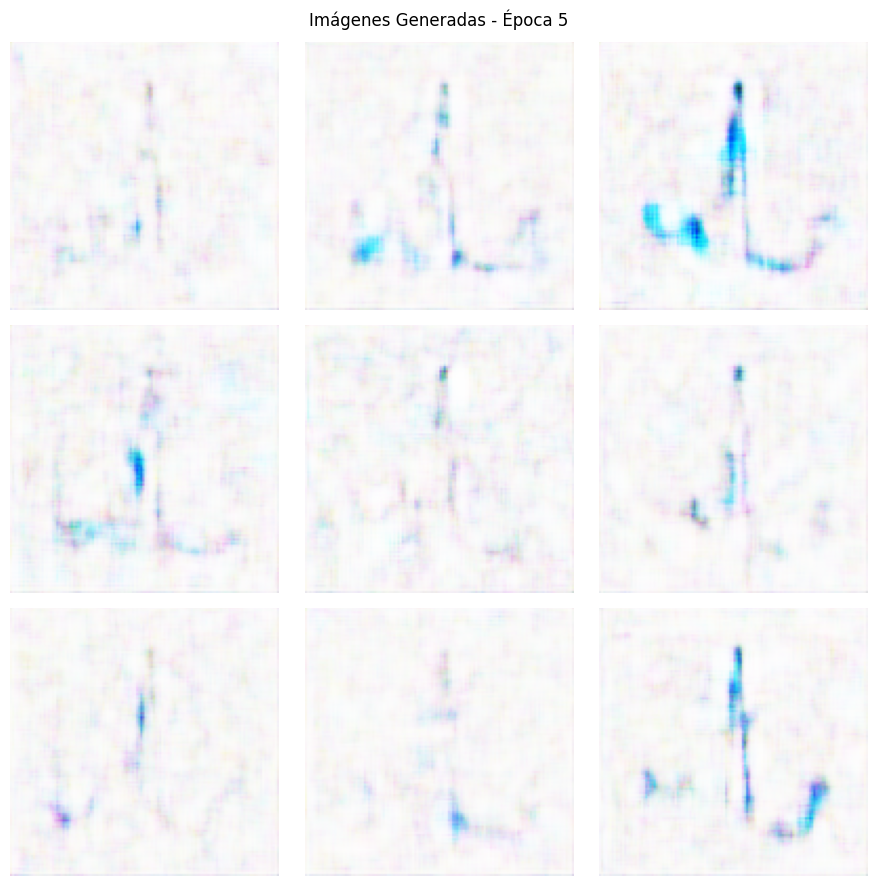

Época 6/150: 100%|██████████| 14/14 [02:16<00:00,  9.75s/it, D_loss=0.4774, G_loss=1.1373]


Época 6/150 - D loss: 0.6046 - G loss: 1.0251


Época 7/150: 100%|██████████| 14/14 [02:13<00:00,  9.53s/it, D_loss=0.5320, G_loss=1.1840]


Época 7/150 - D loss: 0.5743 - G loss: 0.9927


Época 8/150: 100%|██████████| 14/14 [02:16<00:00,  9.72s/it, D_loss=0.6573, G_loss=1.8190]


Época 8/150 - D loss: 0.5516 - G loss: 0.9945


Época 9/150: 100%|██████████| 14/14 [02:18<00:00,  9.88s/it, D_loss=0.5392, G_loss=1.1875]


Época 9/150 - D loss: 0.5525 - G loss: 0.9565


Época 10/150: 100%|██████████| 14/14 [02:11<00:00,  9.39s/it, D_loss=0.5125, G_loss=0.6894]


Época 10/150 - D loss: 0.5274 - G loss: 1.0154


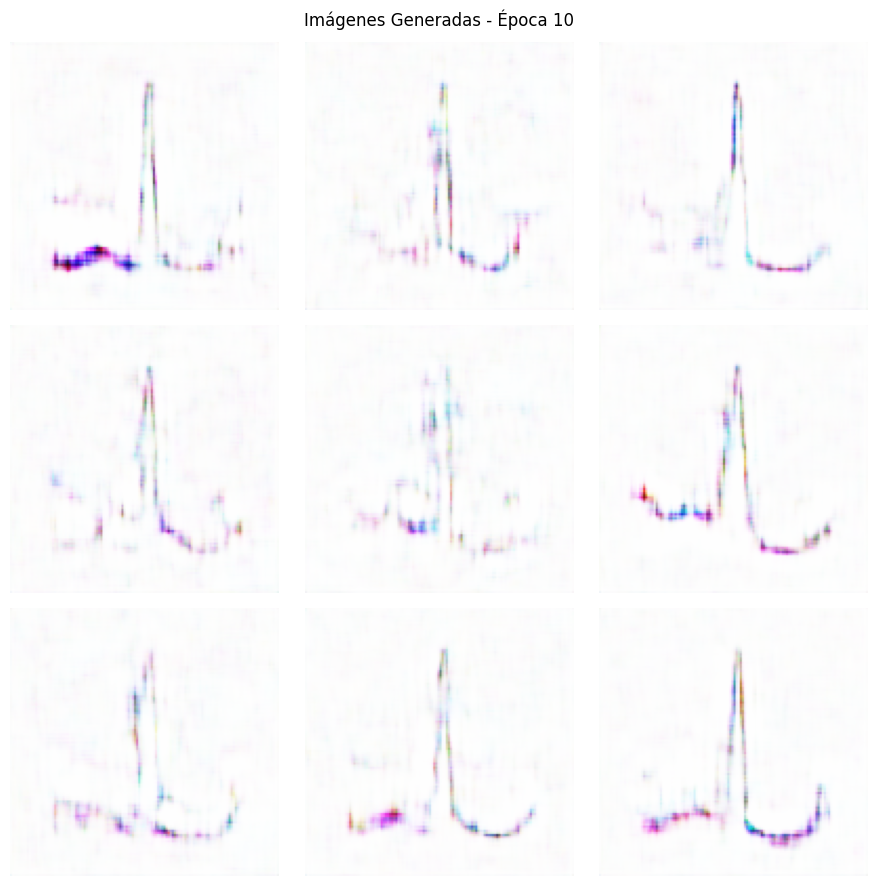

Época 11/150: 100%|██████████| 14/14 [02:06<00:00,  9.04s/it, D_loss=0.5052, G_loss=1.1327]


Época 11/150 - D loss: 0.5154 - G loss: 1.1342


Época 12/150: 100%|██████████| 14/14 [02:02<00:00,  8.76s/it, D_loss=0.4895, G_loss=0.8822]


Época 12/150 - D loss: 0.5155 - G loss: 1.1018


Época 13/150: 100%|██████████| 14/14 [02:04<00:00,  8.88s/it, D_loss=0.4855, G_loss=1.5482]


Época 13/150 - D loss: 0.5018 - G loss: 1.1763


Época 14/150: 100%|██████████| 14/14 [02:03<00:00,  8.86s/it, D_loss=0.4620, G_loss=0.9156]


Época 14/150 - D loss: 0.4776 - G loss: 1.1384


Época 15/150: 100%|██████████| 14/14 [02:00<00:00,  8.61s/it, D_loss=0.4630, G_loss=0.9286]


Época 15/150 - D loss: 0.5215 - G loss: 1.1792


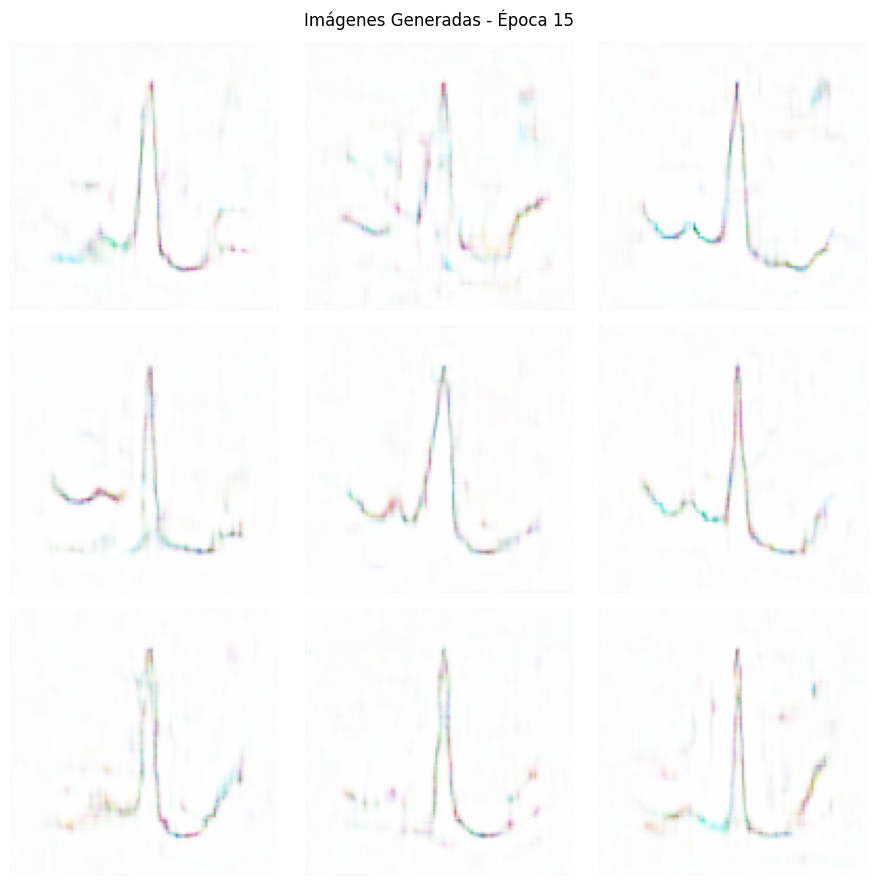

Época 16/150: 100%|██████████| 14/14 [01:59<00:00,  8.53s/it, D_loss=0.5071, G_loss=0.5943]


Época 16/150 - D loss: 0.4996 - G loss: 1.2123


Época 17/150: 100%|██████████| 14/14 [01:59<00:00,  8.50s/it, D_loss=0.6928, G_loss=0.6082]


Época 17/150 - D loss: 0.5044 - G loss: 1.1466


Época 18/150: 100%|██████████| 14/14 [01:59<00:00,  8.50s/it, D_loss=0.4561, G_loss=0.9448]


Época 18/150 - D loss: 0.4724 - G loss: 1.2061


Época 19/150: 100%|██████████| 14/14 [01:59<00:00,  8.54s/it, D_loss=0.4556, G_loss=1.4150]


Época 19/150 - D loss: 0.4883 - G loss: 1.2976


Época 20/150: 100%|██████████| 14/14 [01:42<00:00,  7.35s/it, D_loss=0.4909, G_loss=1.6897]


Época 20/150 - D loss: 0.4891 - G loss: 1.2032


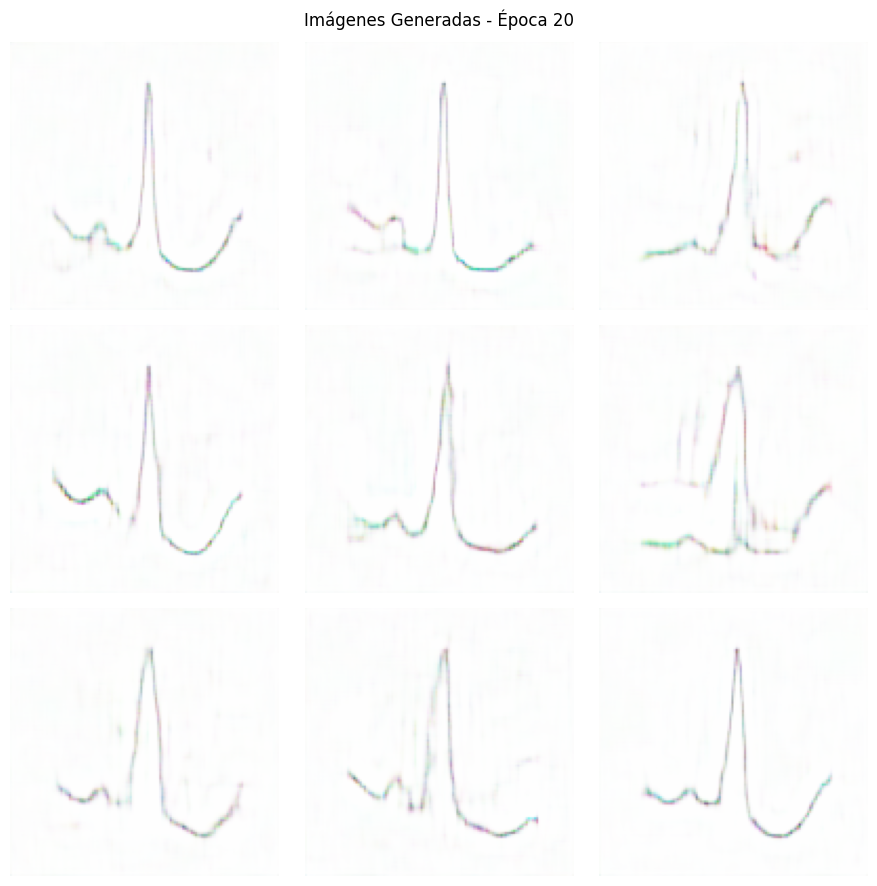

Época 21/150: 100%|██████████| 14/14 [01:40<00:00,  7.19s/it, D_loss=0.5103, G_loss=1.1090]


Época 21/150 - D loss: 0.5006 - G loss: 1.2338


Época 22/150: 100%|██████████| 14/14 [01:39<00:00,  7.13s/it, D_loss=0.4736, G_loss=1.9001]


Época 22/150 - D loss: 0.5084 - G loss: 1.2172


Época 23/150: 100%|██████████| 14/14 [01:40<00:00,  7.15s/it, D_loss=0.6843, G_loss=0.7642]


Época 23/150 - D loss: 0.5218 - G loss: 1.2562


Época 24/150: 100%|██████████| 14/14 [01:38<00:00,  7.06s/it, D_loss=0.4450, G_loss=1.0478]


Época 24/150 - D loss: 0.4742 - G loss: 1.2270


Época 25/150: 100%|██████████| 14/14 [01:41<00:00,  7.26s/it, D_loss=0.5551, G_loss=2.0600]


Época 25/150 - D loss: 0.4844 - G loss: 1.3429


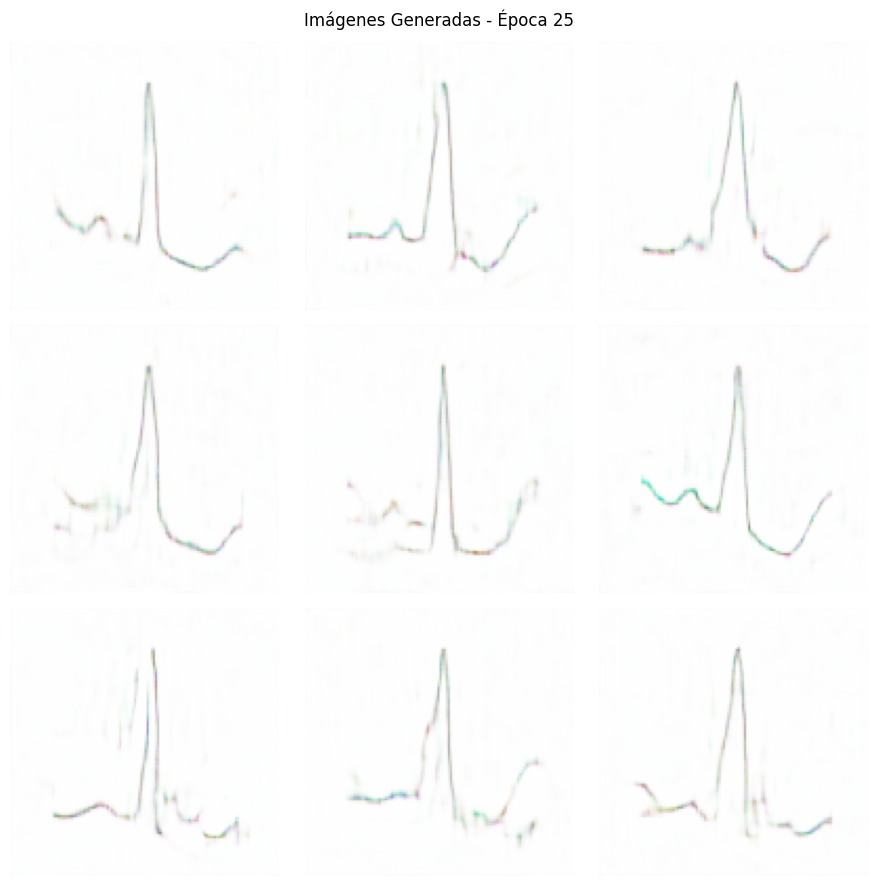

Época 26/150: 100%|██████████| 14/14 [01:42<00:00,  7.34s/it, D_loss=0.4777, G_loss=1.6248]


Época 26/150 - D loss: 0.4726 - G loss: 1.3150


Época 27/150: 100%|██████████| 14/14 [01:48<00:00,  7.76s/it, D_loss=0.5294, G_loss=0.5509]


Época 27/150 - D loss: 0.4921 - G loss: 1.1952


Época 28/150: 100%|██████████| 14/14 [01:29<00:00,  6.38s/it, D_loss=0.6560, G_loss=2.3687]


Época 28/150 - D loss: 0.4882 - G loss: 1.3993


Época 29/150: 100%|██████████| 14/14 [01:23<00:00,  5.95s/it, D_loss=0.4411, G_loss=1.3020]


Época 29/150 - D loss: 0.4975 - G loss: 1.1783


Época 30/150: 100%|██████████| 14/14 [01:54<00:00,  8.16s/it, D_loss=0.4432, G_loss=1.1162]


Época 30/150 - D loss: 0.4942 - G loss: 1.2673


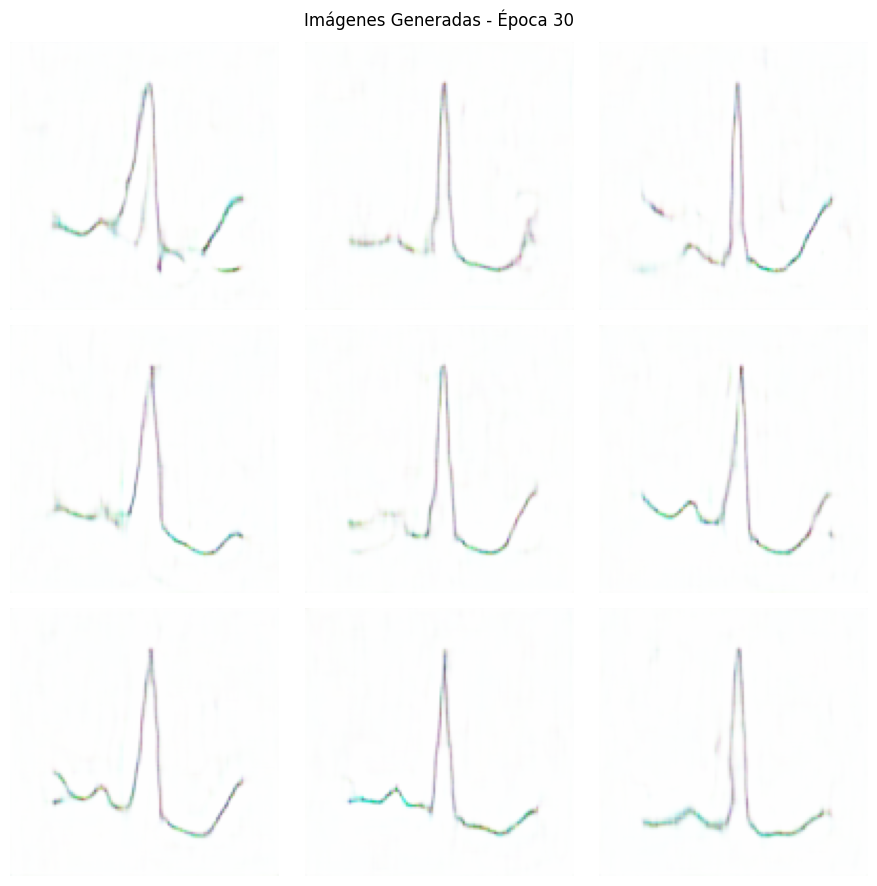

Época 31/150: 100%|██████████| 14/14 [01:42<00:00,  7.31s/it, D_loss=0.4727, G_loss=1.6037]


Época 31/150 - D loss: 0.4800 - G loss: 1.3746


Época 32/150: 100%|██████████| 14/14 [01:29<00:00,  6.41s/it, D_loss=0.4320, G_loss=0.8896]


Época 32/150 - D loss: 0.4759 - G loss: 1.2538


Época 33/150: 100%|██████████| 14/14 [01:21<00:00,  5.83s/it, D_loss=0.4272, G_loss=1.2170]


Época 33/150 - D loss: 0.4855 - G loss: 1.3419


Época 34/150: 100%|██████████| 14/14 [01:21<00:00,  5.83s/it, D_loss=0.5568, G_loss=1.6176]


Época 34/150 - D loss: 0.4876 - G loss: 1.3472


Época 35/150: 100%|██████████| 14/14 [01:21<00:00,  5.79s/it, D_loss=0.5685, G_loss=2.3963]


Época 35/150 - D loss: 0.4956 - G loss: 1.3831


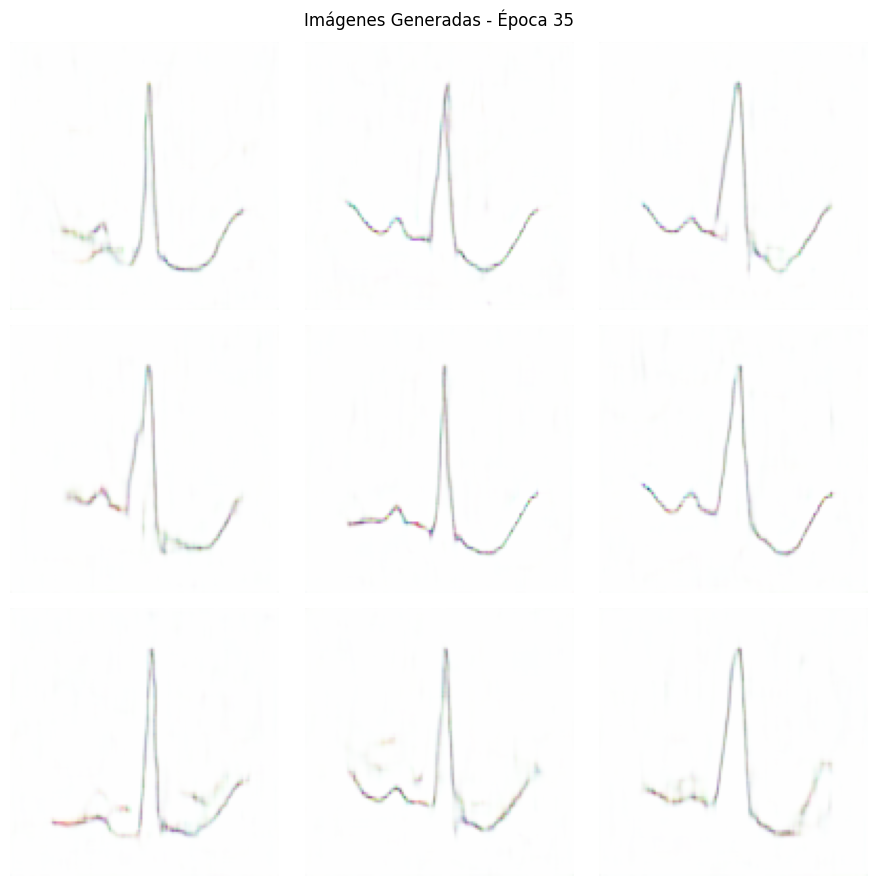

Época 36/150: 100%|██████████| 14/14 [01:20<00:00,  5.75s/it, D_loss=0.4724, G_loss=1.2807]


Época 36/150 - D loss: 0.4603 - G loss: 1.3982


Época 37/150: 100%|██████████| 14/14 [01:18<00:00,  5.62s/it, D_loss=0.4139, G_loss=1.4715]


Época 37/150 - D loss: 0.5219 - G loss: 1.6631


Época 38/150: 100%|██████████| 14/14 [01:19<00:00,  5.65s/it, D_loss=0.3831, G_loss=1.3184]


Época 38/150 - D loss: 0.4396 - G loss: 1.4070


Época 39/150: 100%|██████████| 14/14 [01:16<00:00,  5.49s/it, D_loss=0.4125, G_loss=0.8315]


Época 39/150 - D loss: 0.4091 - G loss: 1.4137


Época 40/150: 100%|██████████| 14/14 [01:15<00:00,  5.40s/it, D_loss=0.3786, G_loss=1.0892]


Época 40/150 - D loss: 0.4146 - G loss: 1.4634


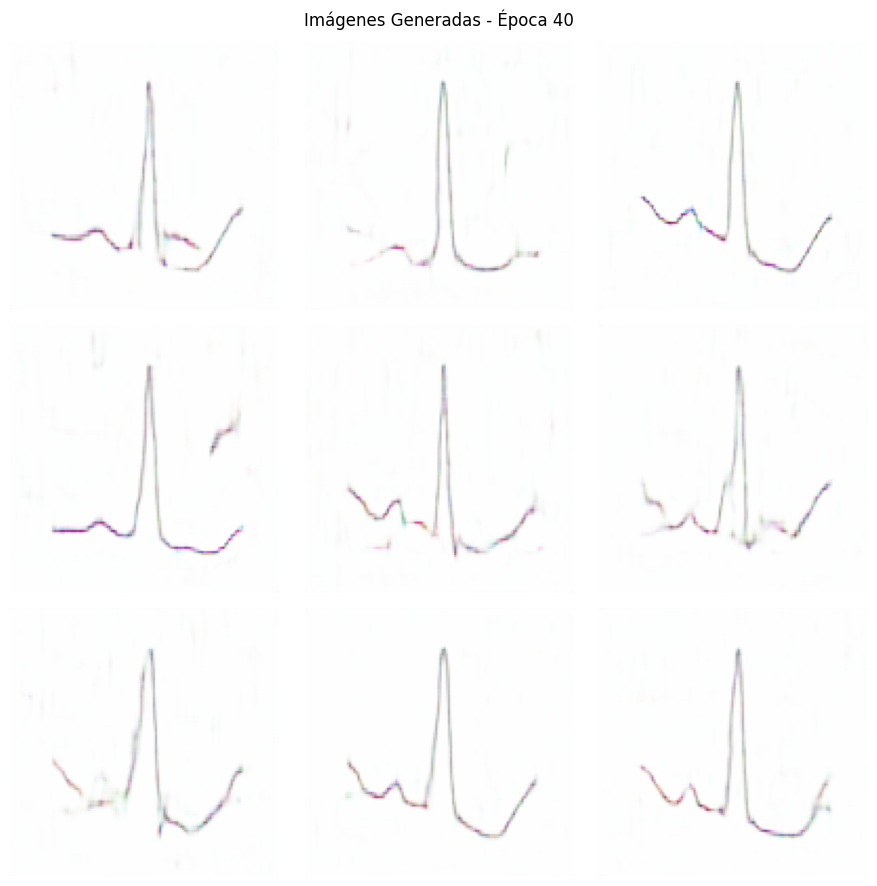

Época 41/150: 100%|██████████| 14/14 [01:14<00:00,  5.31s/it, D_loss=0.3968, G_loss=1.3249]


Época 41/150 - D loss: 0.4889 - G loss: 1.5708


Época 42/150: 100%|██████████| 14/14 [01:13<00:00,  5.23s/it, D_loss=0.4223, G_loss=1.7519]


Época 42/150 - D loss: 0.4783 - G loss: 1.5417


Época 43/150: 100%|██████████| 14/14 [01:14<00:00,  5.30s/it, D_loss=0.4429, G_loss=1.0723]


Época 43/150 - D loss: 0.4383 - G loss: 1.3525


Época 44/150: 100%|██████████| 14/14 [01:14<00:00,  5.31s/it, D_loss=0.3660, G_loss=1.2009]


Época 44/150 - D loss: 0.4745 - G loss: 1.4593


Época 45/150: 100%|██████████| 14/14 [01:15<00:00,  5.37s/it, D_loss=0.4547, G_loss=1.6917]


Época 45/150 - D loss: 0.4881 - G loss: 1.5809


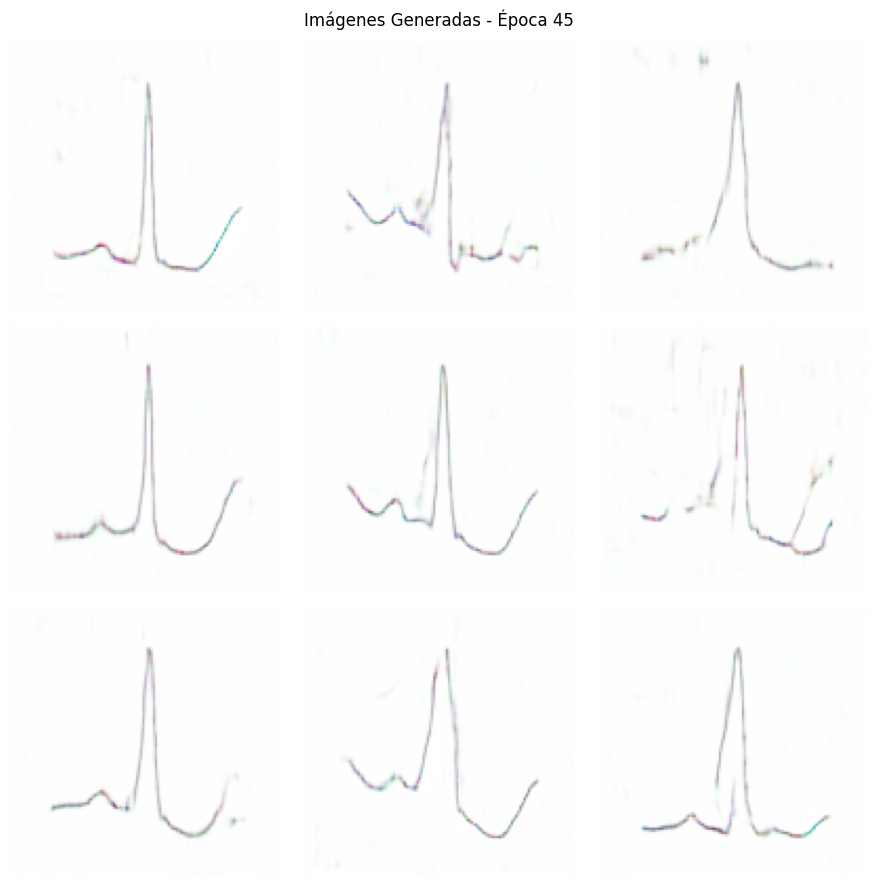

Época 46/150: 100%|██████████| 14/14 [01:13<00:00,  5.25s/it, D_loss=0.3740, G_loss=1.2717]


Época 46/150 - D loss: 0.4583 - G loss: 1.3434


Época 47/150: 100%|██████████| 14/14 [01:12<00:00,  5.15s/it, D_loss=0.4920, G_loss=1.1376]


Época 47/150 - D loss: 0.4278 - G loss: 1.4007


Época 48/150: 100%|██████████| 14/14 [01:12<00:00,  5.18s/it, D_loss=0.4277, G_loss=1.1111]


Época 48/150 - D loss: 0.4525 - G loss: 1.7420


Época 49/150: 100%|██████████| 14/14 [01:12<00:00,  5.21s/it, D_loss=0.5477, G_loss=1.0066]


Época 49/150 - D loss: 0.4384 - G loss: 1.5220


Época 50/150: 100%|██████████| 14/14 [01:12<00:00,  5.19s/it, D_loss=0.3343, G_loss=1.1617]


Época 50/150 - D loss: 0.4344 - G loss: 1.4763


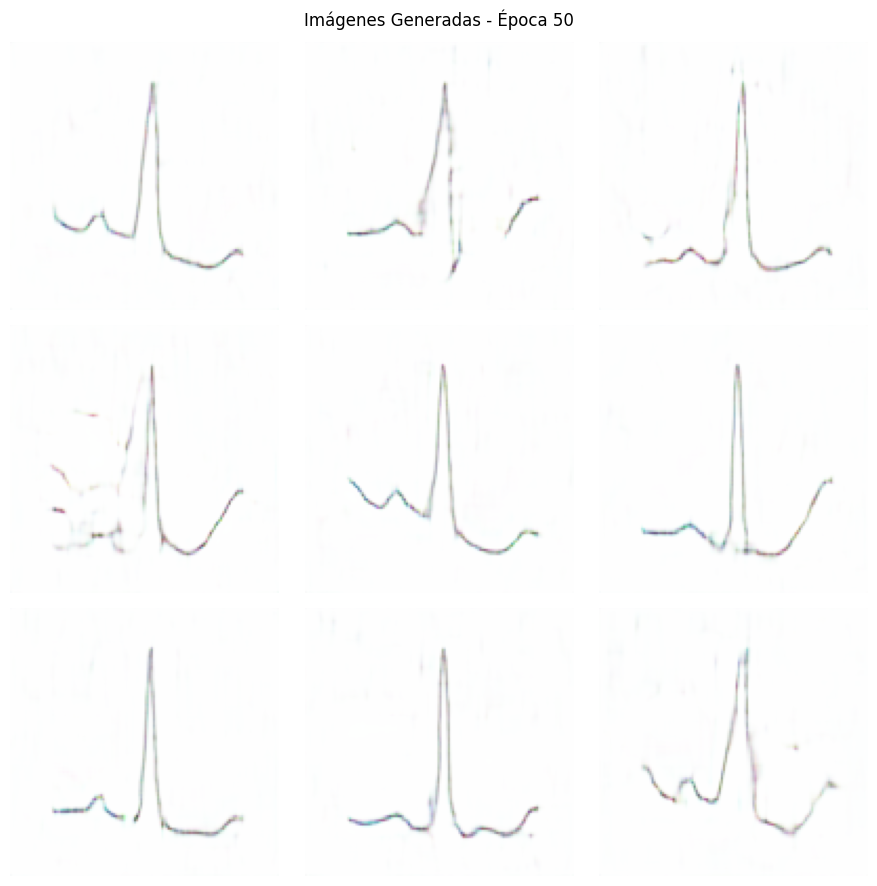

Época 51/150: 100%|██████████| 14/14 [01:13<00:00,  5.22s/it, D_loss=0.4589, G_loss=1.6519]


Época 51/150 - D loss: 0.4342 - G loss: 1.7130


Época 52/150: 100%|██████████| 14/14 [01:12<00:00,  5.16s/it, D_loss=0.3808, G_loss=1.5019]


Época 52/150 - D loss: 0.3951 - G loss: 1.5621


Época 53/150: 100%|██████████| 14/14 [01:11<00:00,  5.12s/it, D_loss=0.4613, G_loss=2.0134]


Época 53/150 - D loss: 0.4450 - G loss: 1.7182


Época 54/150: 100%|██████████| 14/14 [01:12<00:00,  5.16s/it, D_loss=0.3414, G_loss=2.0872]


Época 54/150 - D loss: 0.3979 - G loss: 1.6731


Época 55/150: 100%|██████████| 14/14 [01:12<00:00,  5.16s/it, D_loss=0.5684, G_loss=3.1484]


Época 55/150 - D loss: 0.4439 - G loss: 1.7326


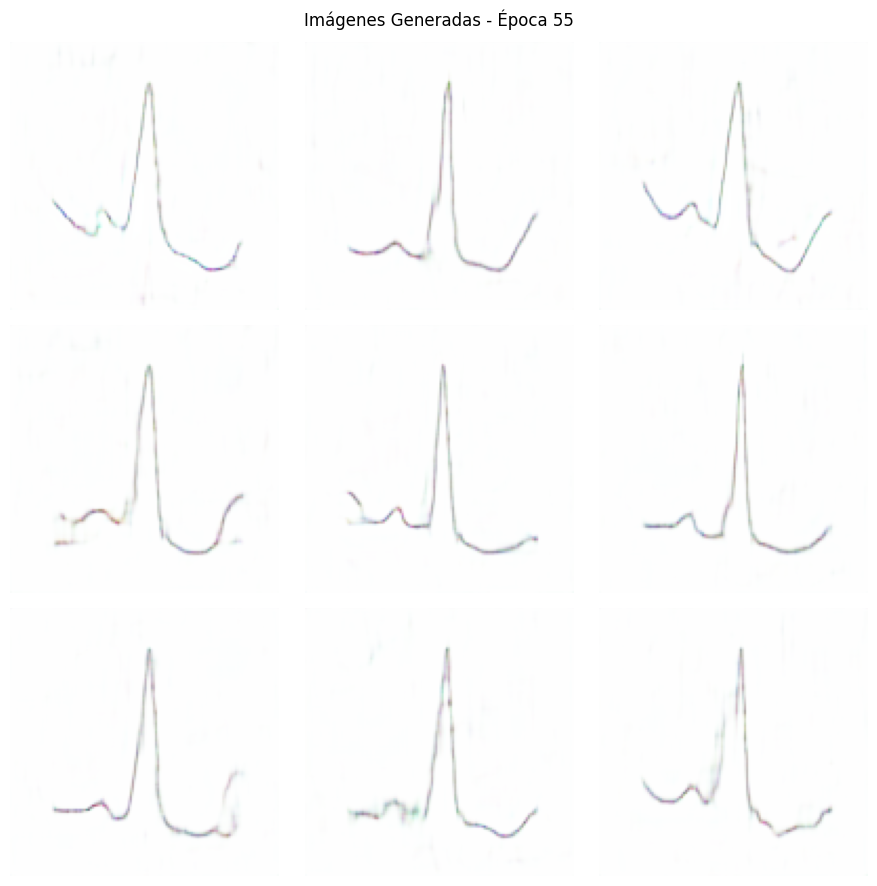

Época 56/150: 100%|██████████| 14/14 [01:12<00:00,  5.16s/it, D_loss=0.4781, G_loss=1.8981]


Época 56/150 - D loss: 0.3986 - G loss: 1.5779


Época 57/150: 100%|██████████| 14/14 [01:11<00:00,  5.13s/it, D_loss=0.3396, G_loss=1.5465]


Época 57/150 - D loss: 0.4405 - G loss: 1.9091


Época 58/150: 100%|██████████| 14/14 [01:12<00:00,  5.15s/it, D_loss=0.2660, G_loss=1.5089]


Época 58/150 - D loss: 0.3809 - G loss: 1.5530


Época 59/150: 100%|██████████| 14/14 [01:11<00:00,  5.11s/it, D_loss=0.3826, G_loss=2.2179]


Época 59/150 - D loss: 0.4179 - G loss: 1.7088


Época 60/150: 100%|██████████| 14/14 [01:12<00:00,  5.15s/it, D_loss=0.2913, G_loss=2.0065]


Época 60/150 - D loss: 0.4018 - G loss: 1.7131


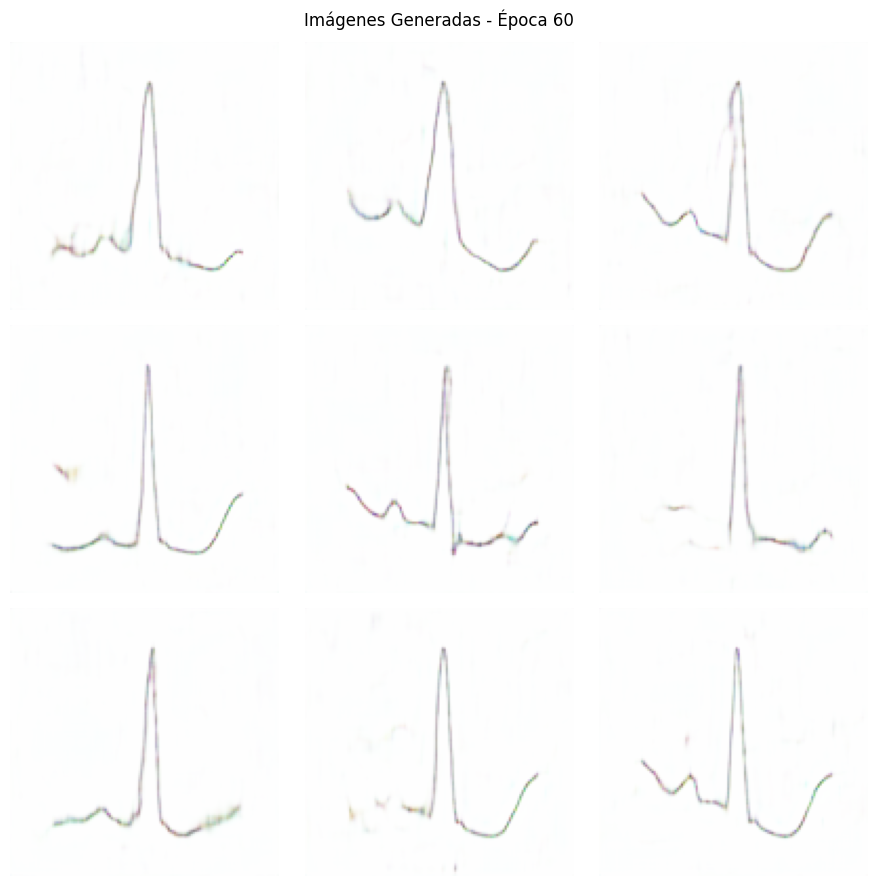

Época 61/150: 100%|██████████| 14/14 [01:12<00:00,  5.20s/it, D_loss=0.3025, G_loss=1.2868]


Época 61/150 - D loss: 0.4102 - G loss: 1.8579


Época 62/150: 100%|██████████| 14/14 [01:12<00:00,  5.14s/it, D_loss=0.4067, G_loss=1.6434]


Época 62/150 - D loss: 0.3998 - G loss: 1.7944


Época 63/150: 100%|██████████| 14/14 [01:19<00:00,  5.65s/it, D_loss=0.6237, G_loss=2.3617]


Época 63/150 - D loss: 0.4364 - G loss: 1.7262


Época 64/150: 100%|██████████| 14/14 [01:18<00:00,  5.60s/it, D_loss=0.3481, G_loss=1.2465]


Época 64/150 - D loss: 0.3815 - G loss: 1.6559


Época 65/150: 100%|██████████| 14/14 [01:12<00:00,  5.21s/it, D_loss=0.5281, G_loss=3.4453]


Época 65/150 - D loss: 0.4705 - G loss: 2.0047


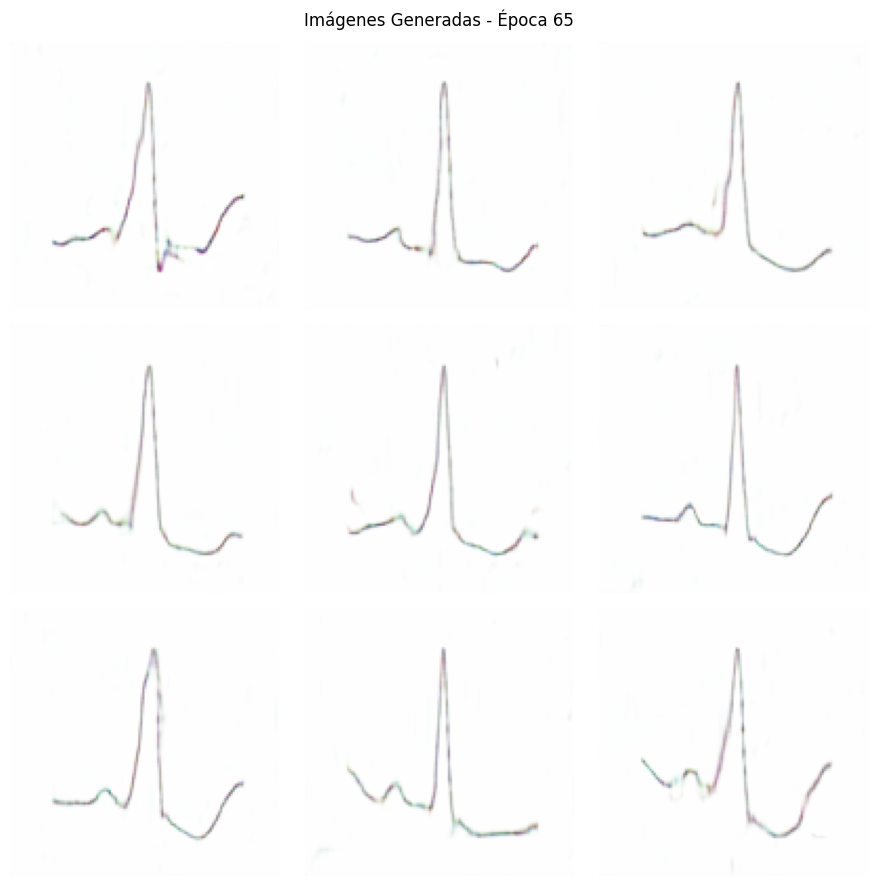

Época 66/150: 100%|██████████| 14/14 [01:52<00:00,  8.02s/it, D_loss=0.3647, G_loss=2.2185]


Época 66/150 - D loss: 0.4043 - G loss: 1.5495


Época 67/150: 100%|██████████| 14/14 [01:29<00:00,  6.42s/it, D_loss=0.4017, G_loss=0.7707]


Época 67/150 - D loss: 0.4361 - G loss: 1.6153


Época 68/150: 100%|██████████| 14/14 [01:17<00:00,  5.51s/it, D_loss=0.3273, G_loss=1.4216]


Época 68/150 - D loss: 0.3670 - G loss: 1.5432


Época 69/150: 100%|██████████| 14/14 [01:14<00:00,  5.33s/it, D_loss=0.4405, G_loss=1.7186]


Época 69/150 - D loss: 0.3831 - G loss: 1.8031


Época 70/150: 100%|██████████| 14/14 [01:15<00:00,  5.38s/it, D_loss=0.3674, G_loss=1.7843]


Época 70/150 - D loss: 0.4025 - G loss: 1.8400


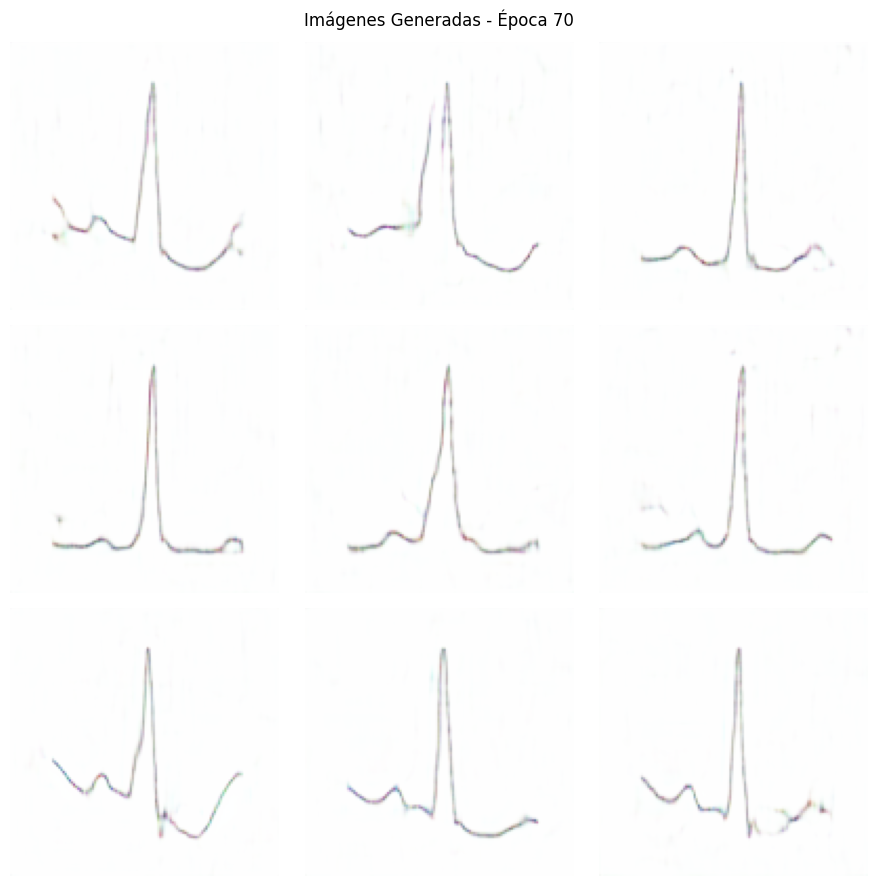

Época 71/150: 100%|██████████| 14/14 [01:16<00:00,  5.47s/it, D_loss=0.4612, G_loss=1.3792]


Época 71/150 - D loss: 0.3926 - G loss: 1.6254


Época 72/150: 100%|██████████| 14/14 [01:14<00:00,  5.34s/it, D_loss=0.4040, G_loss=2.2990]


Época 72/150 - D loss: 0.3981 - G loss: 1.8853


Época 73/150: 100%|██████████| 14/14 [01:15<00:00,  5.36s/it, D_loss=0.3892, G_loss=2.6365]


Época 73/150 - D loss: 0.3784 - G loss: 1.9281


Época 74/150: 100%|██████████| 14/14 [01:15<00:00,  5.36s/it, D_loss=0.4030, G_loss=2.2514]


Época 74/150 - D loss: 0.3770 - G loss: 1.9153


Época 75/150: 100%|██████████| 14/14 [01:14<00:00,  5.35s/it, D_loss=0.4000, G_loss=1.0978]


Época 75/150 - D loss: 0.3421 - G loss: 1.8091


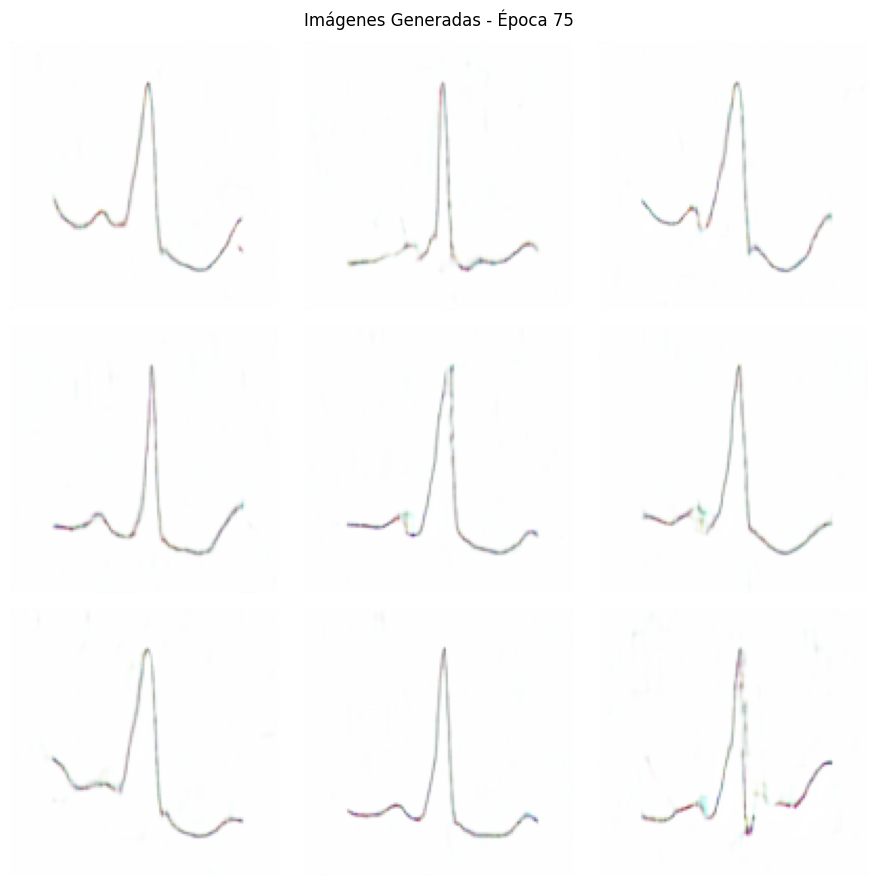

Época 76/150: 100%|██████████| 14/14 [01:14<00:00,  5.34s/it, D_loss=0.4731, G_loss=2.5762]


Época 76/150 - D loss: 0.4429 - G loss: 2.1468


Época 77/150: 100%|██████████| 14/14 [01:14<00:00,  5.32s/it, D_loss=0.3404, G_loss=1.4749]


Época 77/150 - D loss: 0.3521 - G loss: 1.6998


Época 78/150: 100%|██████████| 14/14 [01:15<00:00,  5.36s/it, D_loss=0.3364, G_loss=1.8660]


Época 78/150 - D loss: 0.3690 - G loss: 1.8316


Época 79/150: 100%|██████████| 14/14 [01:14<00:00,  5.35s/it, D_loss=0.3718, G_loss=1.3163]


Época 79/150 - D loss: 0.3596 - G loss: 1.7459


Época 80/150: 100%|██████████| 14/14 [01:14<00:00,  5.33s/it, D_loss=0.3079, G_loss=1.6536]


Época 80/150 - D loss: 0.3266 - G loss: 1.8128


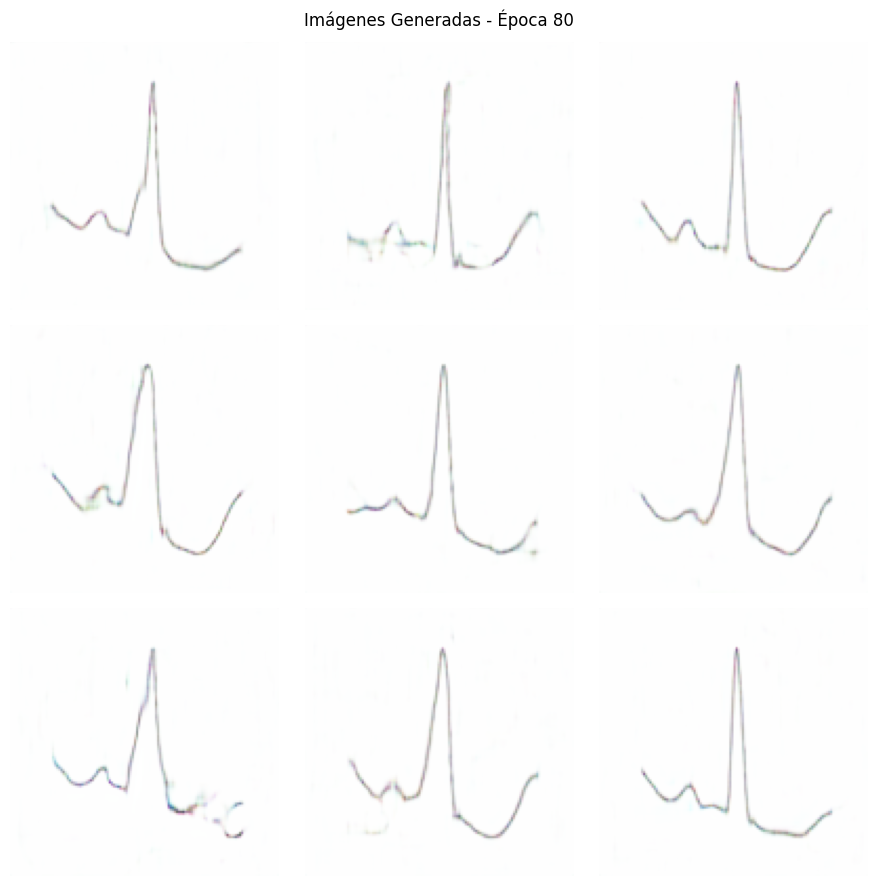

Época 81/150: 100%|██████████| 14/14 [01:14<00:00,  5.33s/it, D_loss=0.3016, G_loss=2.8866]


Época 81/150 - D loss: 0.3757 - G loss: 1.9492


Época 82/150: 100%|██████████| 14/14 [01:14<00:00,  5.30s/it, D_loss=0.2663, G_loss=2.2168]


Época 82/150 - D loss: 0.2938 - G loss: 2.0433


Época 83/150: 100%|██████████| 14/14 [01:14<00:00,  5.34s/it, D_loss=0.4264, G_loss=2.3235]


Época 83/150 - D loss: 0.3735 - G loss: 2.0439


Época 84/150: 100%|██████████| 14/14 [01:14<00:00,  5.32s/it, D_loss=0.5827, G_loss=2.6478]


Época 84/150 - D loss: 0.3537 - G loss: 1.9632


Época 85/150: 100%|██████████| 14/14 [01:14<00:00,  5.30s/it, D_loss=0.5446, G_loss=3.6855]


Época 85/150 - D loss: 0.3605 - G loss: 2.0054


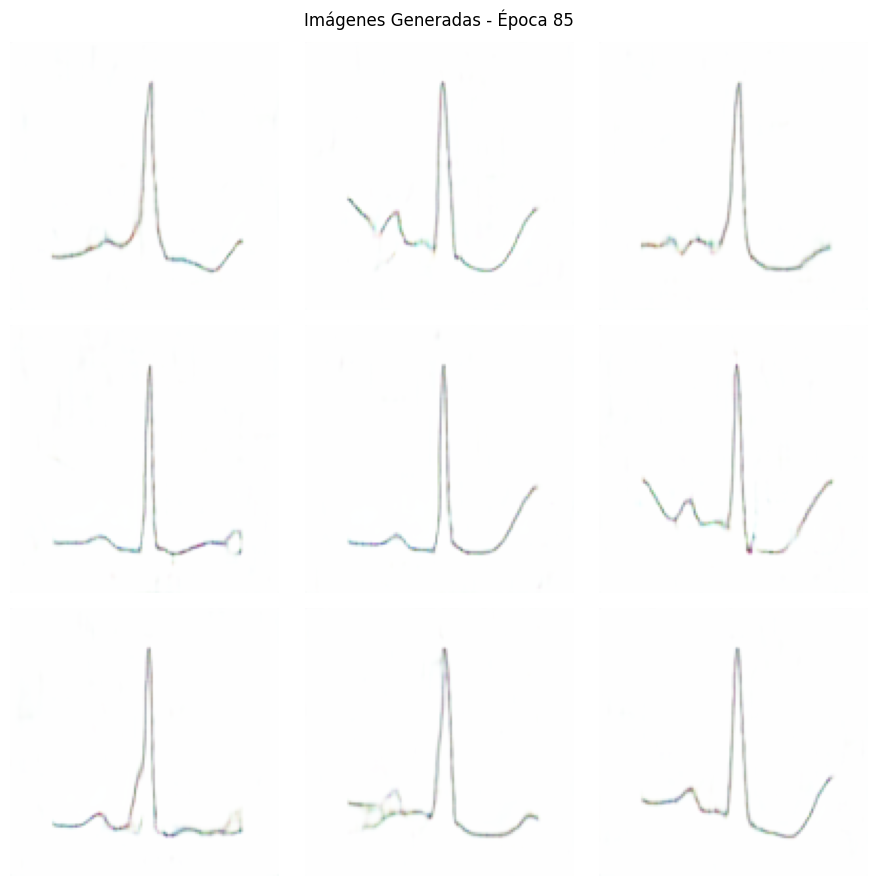

Época 86/150: 100%|██████████| 14/14 [01:14<00:00,  5.30s/it, D_loss=0.4366, G_loss=1.8297]


Época 86/150 - D loss: 0.3625 - G loss: 2.4798


Época 87/150: 100%|██████████| 14/14 [01:16<00:00,  5.49s/it, D_loss=0.3453, G_loss=1.1694]


Época 87/150 - D loss: 0.3495 - G loss: 2.0452


Época 88/150: 100%|██████████| 14/14 [01:15<00:00,  5.37s/it, D_loss=0.3369, G_loss=1.4337]


Época 88/150 - D loss: 0.3499 - G loss: 1.8524


Época 89/150: 100%|██████████| 14/14 [01:17<00:00,  5.54s/it, D_loss=0.4550, G_loss=1.6781]


Época 89/150 - D loss: 0.3677 - G loss: 2.2560


Época 90/150: 100%|██████████| 14/14 [01:19<00:00,  5.66s/it, D_loss=0.2756, G_loss=3.2533]


Época 90/150 - D loss: 0.3268 - G loss: 2.0434


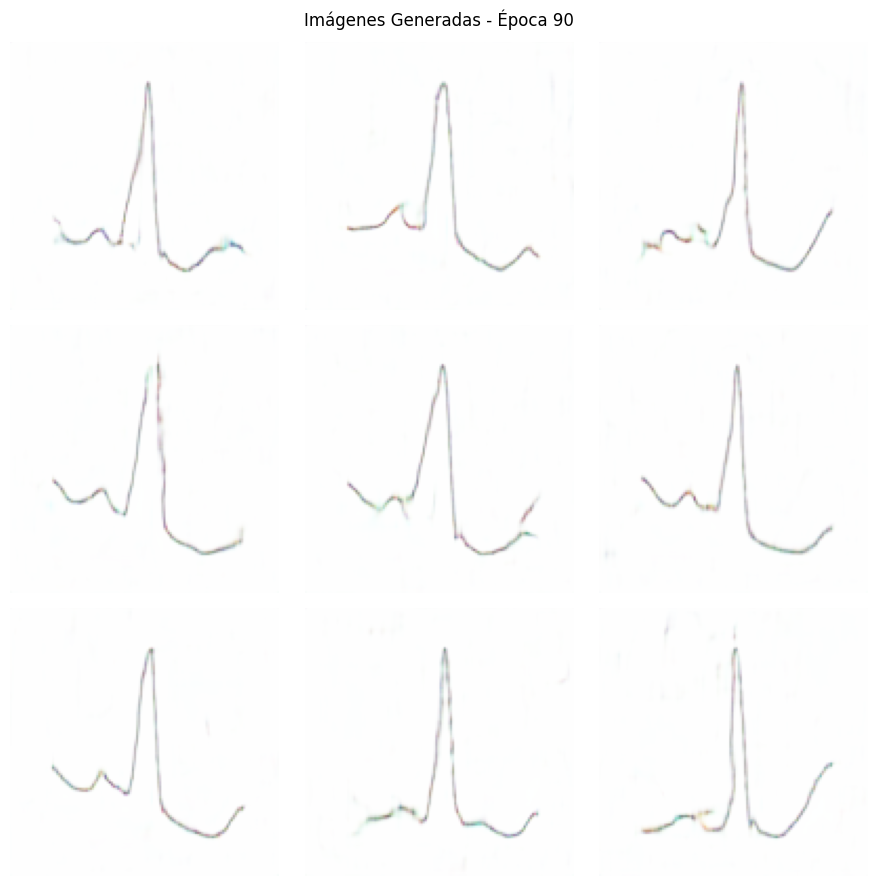

Época 91/150: 100%|██████████| 14/14 [01:14<00:00,  5.32s/it, D_loss=0.3377, G_loss=1.7310]


Época 91/150 - D loss: 0.4413 - G loss: 2.5549


Época 92/150: 100%|██████████| 14/14 [01:14<00:00,  5.29s/it, D_loss=0.3001, G_loss=2.1029]


Época 92/150 - D loss: 0.2998 - G loss: 1.7976


Época 93/150: 100%|██████████| 14/14 [01:27<00:00,  6.27s/it, D_loss=0.5536, G_loss=3.8380]


Época 93/150 - D loss: 0.3300 - G loss: 2.1084


Época 94/150: 100%|██████████| 14/14 [01:20<00:00,  5.77s/it, D_loss=0.5157, G_loss=1.4326]


Época 94/150 - D loss: 0.4378 - G loss: 2.1911


Época 95/150: 100%|██████████| 14/14 [01:17<00:00,  5.54s/it, D_loss=0.2999, G_loss=2.1568]


Época 95/150 - D loss: 0.2870 - G loss: 1.8732


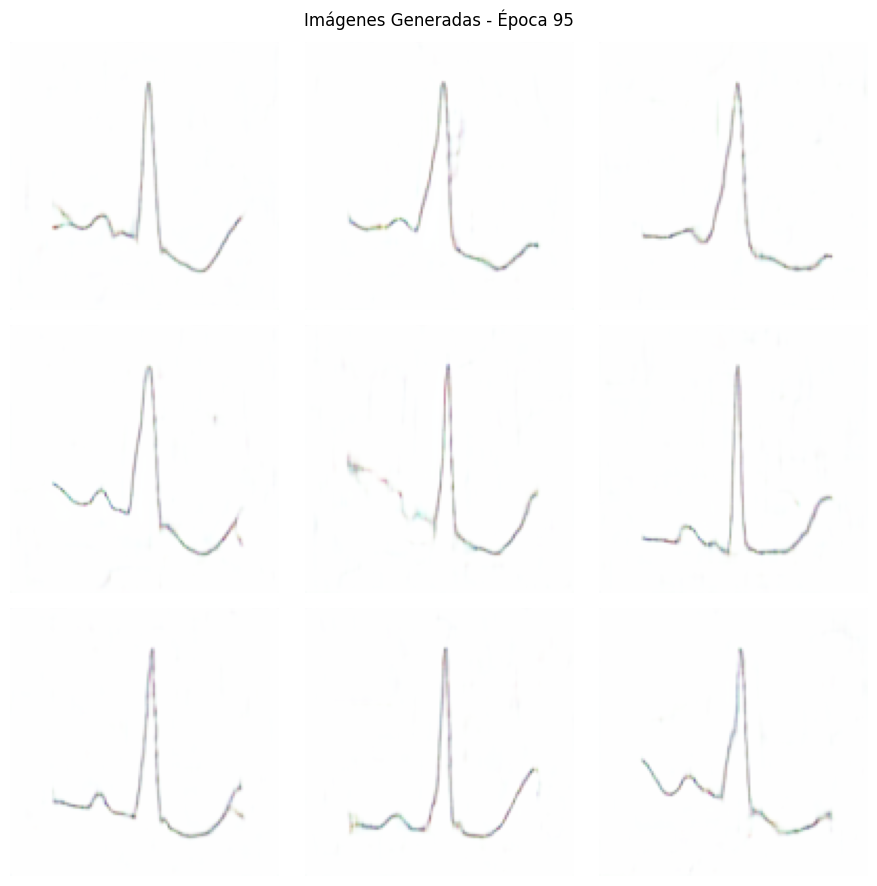

Época 96/150: 100%|██████████| 14/14 [01:18<00:00,  5.60s/it, D_loss=0.3405, G_loss=2.2210]


Época 96/150 - D loss: 0.3348 - G loss: 2.1511


Época 97/150: 100%|██████████| 14/14 [01:22<00:00,  5.88s/it, D_loss=0.2758, G_loss=3.2252]


Época 97/150 - D loss: 0.2859 - G loss: 2.1058


Época 98/150: 100%|██████████| 14/14 [01:21<00:00,  5.85s/it, D_loss=0.5468, G_loss=1.3399]


Época 98/150 - D loss: 0.3133 - G loss: 2.1034


Época 99/150: 100%|██████████| 14/14 [01:26<00:00,  6.15s/it, D_loss=0.2331, G_loss=1.8068]


Época 99/150 - D loss: 0.3437 - G loss: 2.4700


Época 100/150: 100%|██████████| 14/14 [01:48<00:00,  7.74s/it, D_loss=0.2869, G_loss=1.8135]


Época 100/150 - D loss: 0.3254 - G loss: 2.4223


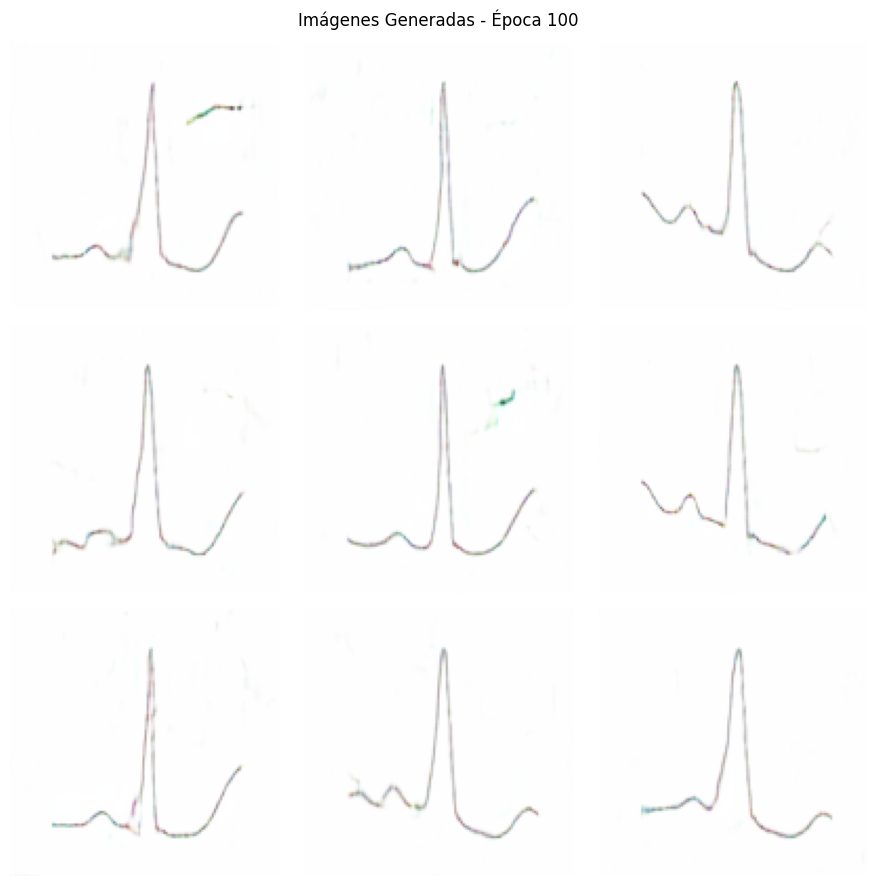

Época 101/150: 100%|██████████| 14/14 [02:01<00:00,  8.65s/it, D_loss=0.2294, G_loss=3.0851]


Época 101/150 - D loss: 0.3212 - G loss: 2.6154


Época 102/150: 100%|██████████| 14/14 [01:45<00:00,  7.52s/it, D_loss=0.4705, G_loss=2.7877]


Época 102/150 - D loss: 0.3073 - G loss: 2.4003


Época 103/150: 100%|██████████| 14/14 [01:46<00:00,  7.58s/it, D_loss=0.5072, G_loss=1.2932]


Época 103/150 - D loss: 0.2934 - G loss: 2.2916


Época 104/150: 100%|██████████| 14/14 [01:32<00:00,  6.61s/it, D_loss=0.2067, G_loss=2.2889]


Época 104/150 - D loss: 0.3095 - G loss: 2.5590


Época 105/150: 100%|██████████| 14/14 [01:22<00:00,  5.90s/it, D_loss=0.2941, G_loss=1.2978]


Época 105/150 - D loss: 0.2899 - G loss: 2.1648


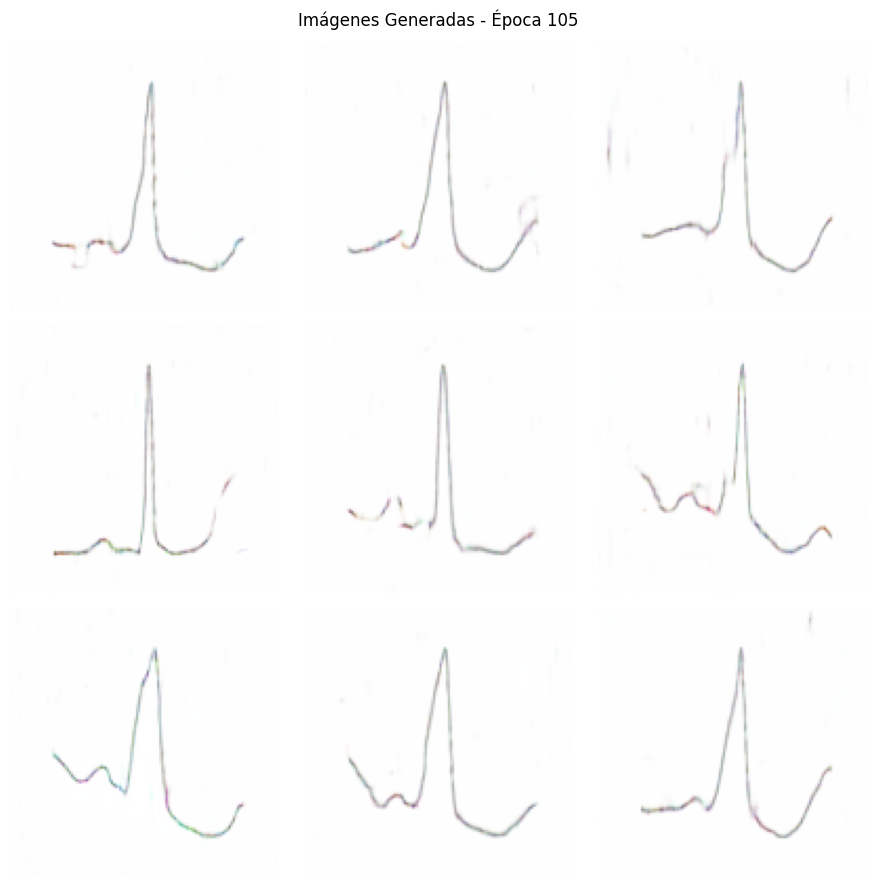

Época 106/150: 100%|██████████| 14/14 [01:23<00:00,  5.99s/it, D_loss=0.2763, G_loss=1.9877]


Época 106/150 - D loss: 0.3298 - G loss: 2.3684


Época 107/150: 100%|██████████| 14/14 [01:27<00:00,  6.24s/it, D_loss=0.3029, G_loss=1.3782]


Época 107/150 - D loss: 0.3523 - G loss: 2.2661


Época 108/150: 100%|██████████| 14/14 [01:24<00:00,  6.06s/it, D_loss=0.2950, G_loss=2.2242]


Época 108/150 - D loss: 0.3182 - G loss: 2.2091


Época 109/150: 100%|██████████| 14/14 [01:22<00:00,  5.88s/it, D_loss=0.4094, G_loss=0.9996]


Época 109/150 - D loss: 0.2775 - G loss: 2.1529


Época 110/150: 100%|██████████| 14/14 [01:21<00:00,  5.81s/it, D_loss=0.6149, G_loss=4.7704]


Época 110/150 - D loss: 0.3722 - G loss: 2.6486


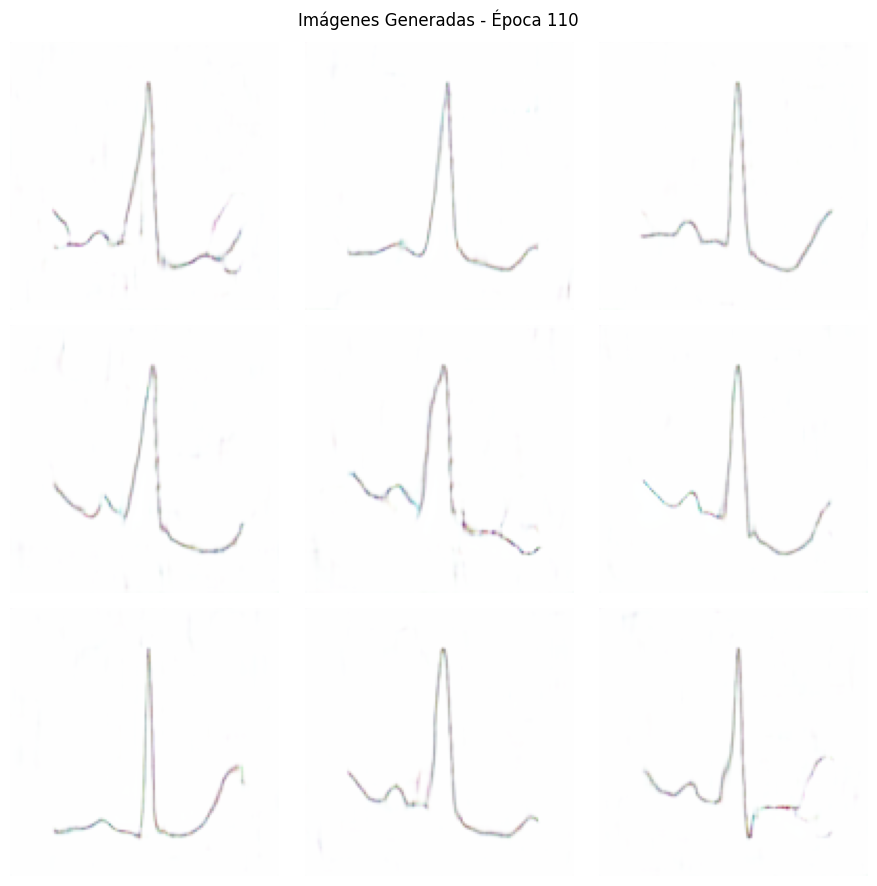

Época 111/150: 100%|██████████| 14/14 [01:24<00:00,  6.01s/it, D_loss=0.1974, G_loss=2.6950]


Época 111/150 - D loss: 0.2491 - G loss: 2.3619


Época 112/150: 100%|██████████| 14/14 [01:22<00:00,  5.89s/it, D_loss=0.5512, G_loss=3.5822]


Época 112/150 - D loss: 0.2869 - G loss: 2.3476


Época 113/150: 100%|██████████| 14/14 [01:25<00:00,  6.12s/it, D_loss=0.2647, G_loss=2.2297]


Época 113/150 - D loss: 0.3535 - G loss: 2.8235


Época 114/150: 100%|██████████| 14/14 [01:22<00:00,  5.91s/it, D_loss=0.4114, G_loss=3.2460]


Época 114/150 - D loss: 0.3804 - G loss: 2.1568


Época 115/150: 100%|██████████| 14/14 [01:18<00:00,  5.62s/it, D_loss=0.2512, G_loss=3.2355]


Época 115/150 - D loss: 0.3380 - G loss: 2.3427


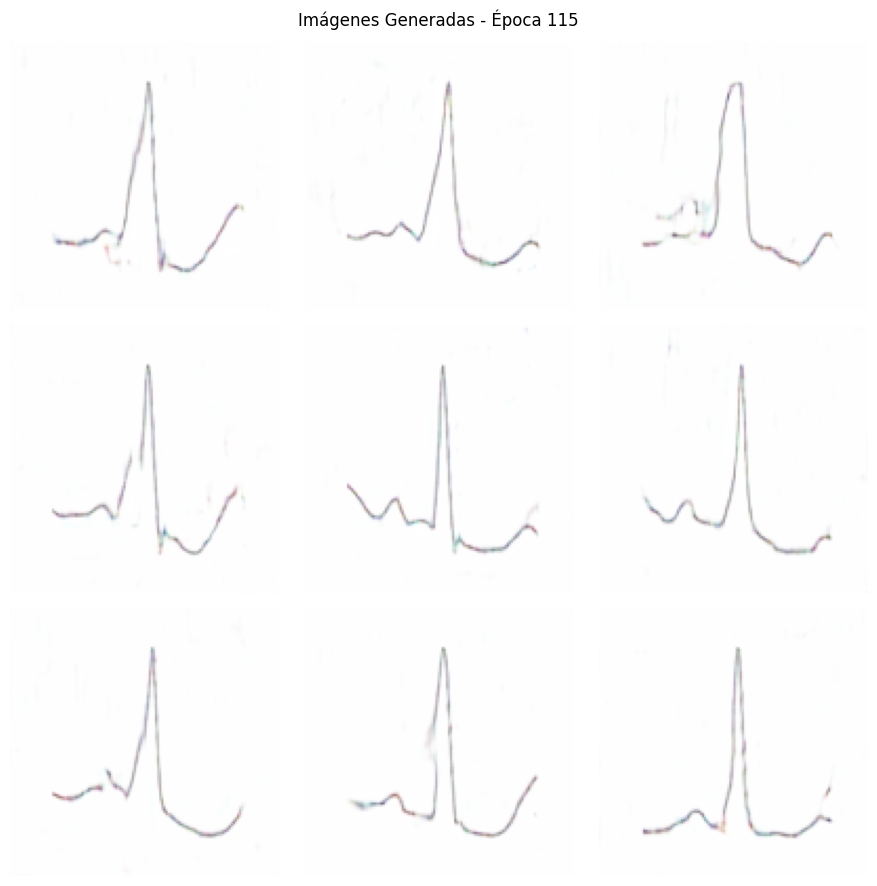

Época 116/150: 100%|██████████| 14/14 [01:20<00:00,  5.76s/it, D_loss=0.2345, G_loss=2.1053]


Época 116/150 - D loss: 0.2674 - G loss: 2.1031


Época 117/150: 100%|██████████| 14/14 [01:19<00:00,  5.71s/it, D_loss=0.2075, G_loss=2.1014]


Época 117/150 - D loss: 0.2848 - G loss: 2.2421


Época 118/150: 100%|██████████| 14/14 [01:22<00:00,  5.86s/it, D_loss=0.1588, G_loss=1.3572]


Época 118/150 - D loss: 0.2869 - G loss: 2.4500


Época 119/150: 100%|██████████| 14/14 [01:22<00:00,  5.87s/it, D_loss=2.2250, G_loss=10.1183]


Época 119/150 - D loss: 0.5985 - G loss: 3.4659


Época 120/150: 100%|██████████| 14/14 [01:19<00:00,  5.69s/it, D_loss=0.2544, G_loss=2.2328]


Época 120/150 - D loss: 0.5370 - G loss: 2.5074


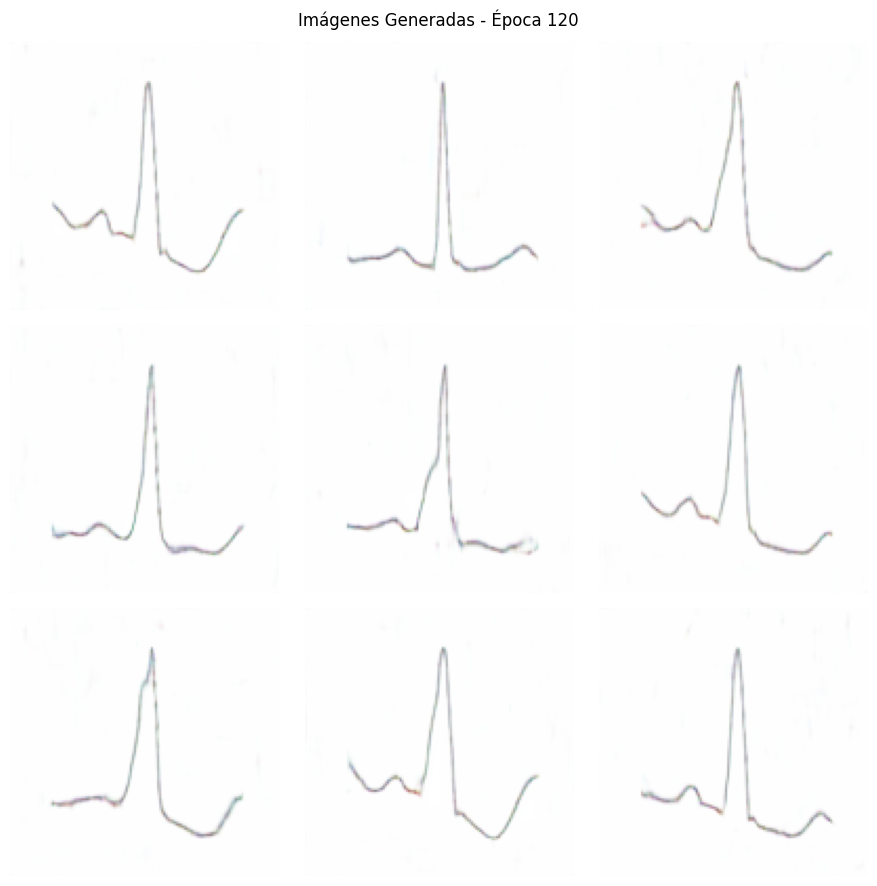

Época 121/150: 100%|██████████| 14/14 [01:26<00:00,  6.18s/it, D_loss=0.3091, G_loss=1.9503]


Época 121/150 - D loss: 0.3254 - G loss: 1.7538


Época 122/150: 100%|██████████| 14/14 [01:21<00:00,  5.84s/it, D_loss=0.4253, G_loss=2.3449]


Época 122/150 - D loss: 0.3286 - G loss: 1.9259


Época 123/150: 100%|██████████| 14/14 [01:21<00:00,  5.85s/it, D_loss=0.3416, G_loss=2.2526]


Época 123/150 - D loss: 0.3116 - G loss: 1.9380


Época 124/150: 100%|██████████| 14/14 [01:23<00:00,  5.94s/it, D_loss=0.3196, G_loss=2.2388]


Época 124/150 - D loss: 0.2901 - G loss: 1.9504


Época 125/150: 100%|██████████| 14/14 [01:23<00:00,  5.95s/it, D_loss=0.2549, G_loss=1.9726]


Época 125/150 - D loss: 0.2636 - G loss: 2.0899


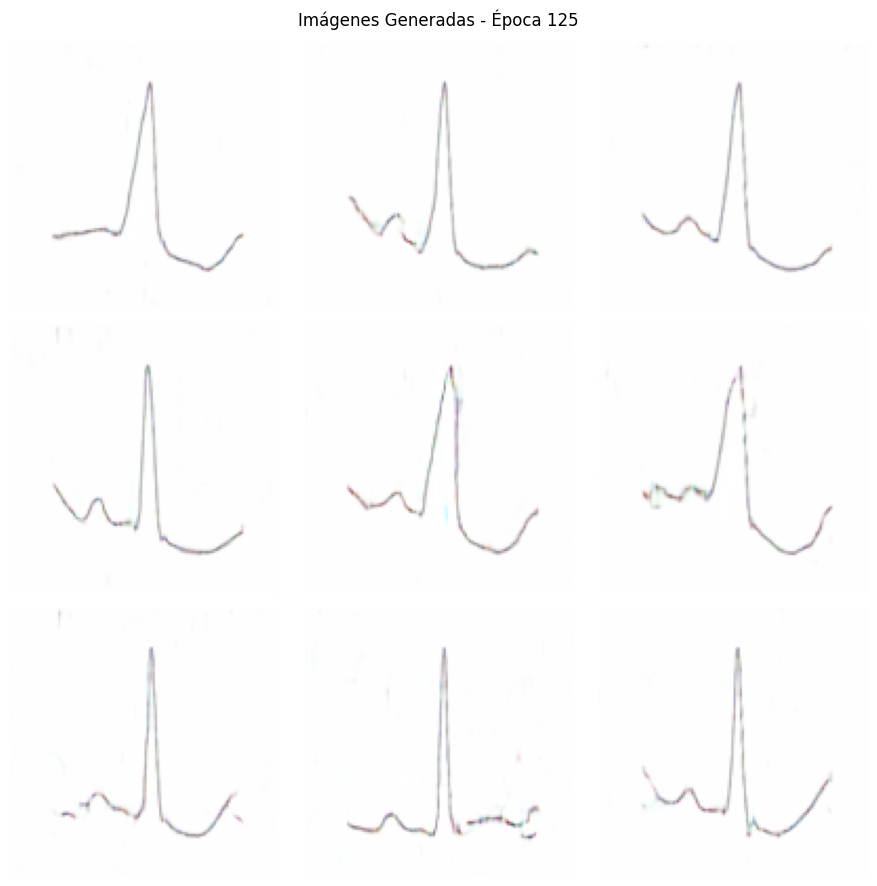

Época 126/150: 100%|██████████| 14/14 [01:30<00:00,  6.44s/it, D_loss=0.6591, G_loss=3.9982]


Época 126/150 - D loss: 0.3562 - G loss: 2.4762


Época 127/150: 100%|██████████| 14/14 [01:27<00:00,  6.25s/it, D_loss=0.3977, G_loss=2.6882]


Época 127/150 - D loss: 0.5048 - G loss: 2.7736


Época 128/150: 100%|██████████| 14/14 [01:22<00:00,  5.91s/it, D_loss=0.3853, G_loss=1.6518]


Época 128/150 - D loss: 0.3662 - G loss: 2.2033


Época 129/150: 100%|██████████| 14/14 [01:21<00:00,  5.85s/it, D_loss=0.4429, G_loss=3.1358]


Época 129/150 - D loss: 0.3219 - G loss: 2.2275


Época 130/150: 100%|██████████| 14/14 [01:23<00:00,  6.00s/it, D_loss=0.2705, G_loss=2.5771]


Época 130/150 - D loss: 0.2703 - G loss: 2.2067


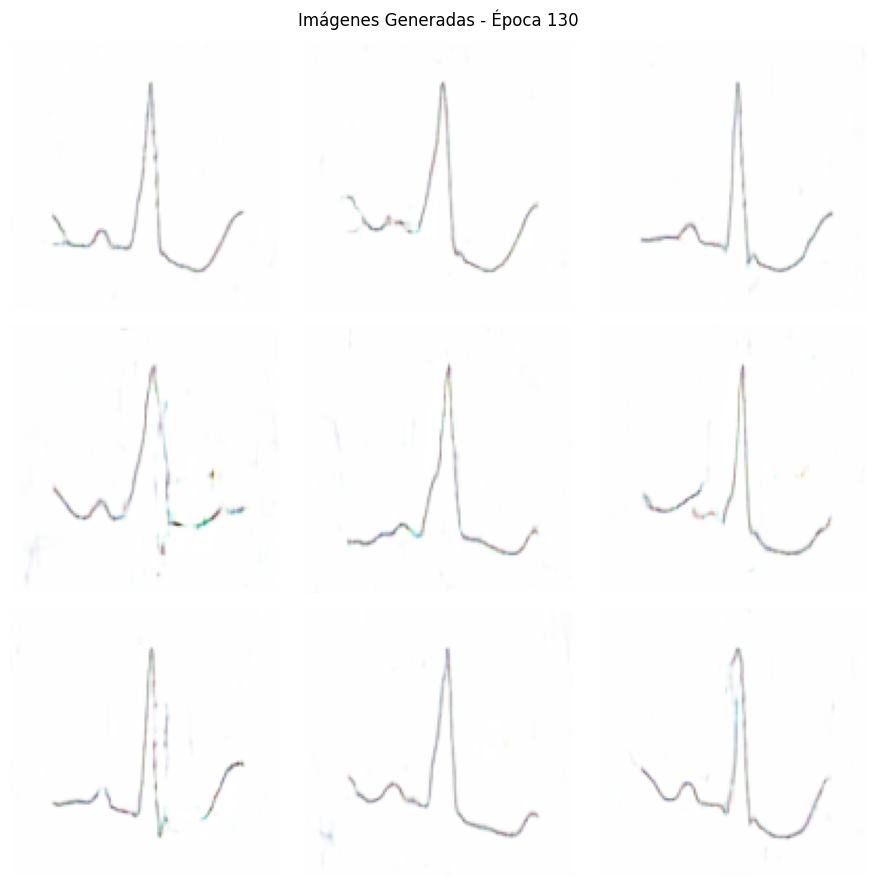

Época 131/150: 100%|██████████| 14/14 [01:26<00:00,  6.19s/it, D_loss=0.2843, G_loss=1.1511]


Época 131/150 - D loss: 0.2648 - G loss: 1.9475


Época 132/150: 100%|██████████| 14/14 [01:22<00:00,  5.93s/it, D_loss=0.6734, G_loss=0.5799]


Época 132/150 - D loss: 0.2651 - G loss: 2.2211


Época 133/150: 100%|██████████| 14/14 [01:20<00:00,  5.77s/it, D_loss=0.3599, G_loss=2.5237]


Época 133/150 - D loss: 0.4040 - G loss: 2.4519


Época 134/150: 100%|██████████| 14/14 [01:21<00:00,  5.80s/it, D_loss=0.2195, G_loss=2.9851]


Época 134/150 - D loss: 0.2842 - G loss: 2.1882


Época 135/150: 100%|██████████| 14/14 [01:22<00:00,  5.91s/it, D_loss=0.2490, G_loss=1.7215]


Época 135/150 - D loss: 0.2691 - G loss: 2.1512


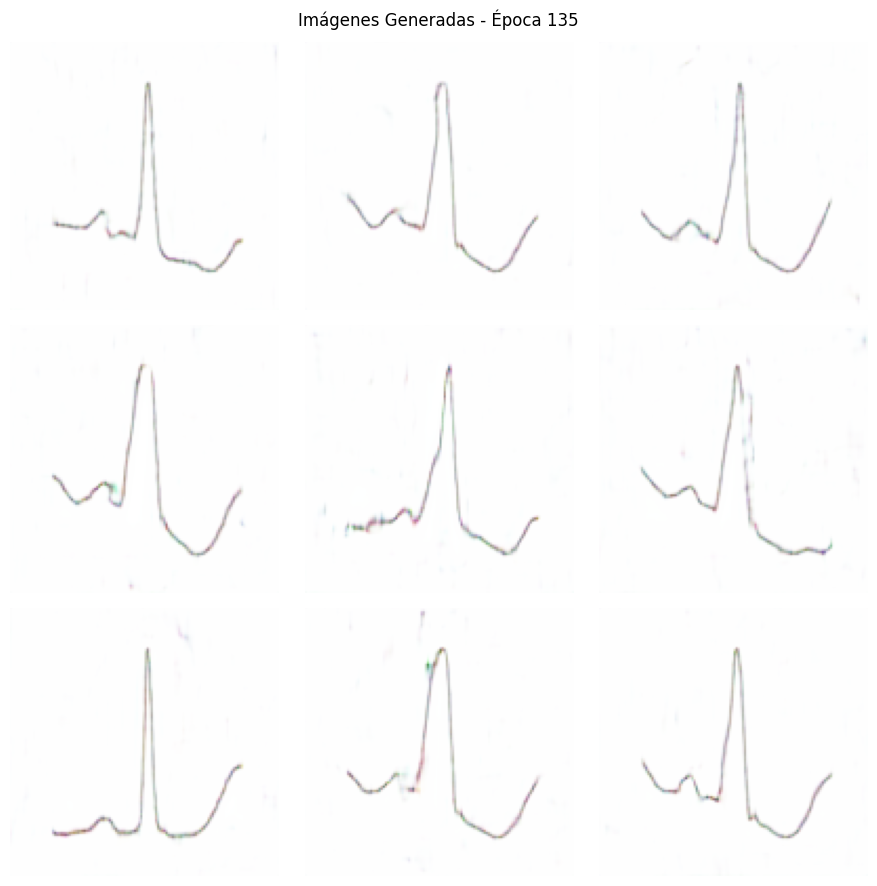

Época 136/150: 100%|██████████| 14/14 [01:22<00:00,  5.87s/it, D_loss=0.2396, G_loss=3.3486]


Época 136/150 - D loss: 0.3253 - G loss: 2.7263


Época 137/150: 100%|██████████| 14/14 [01:21<00:00,  5.85s/it, D_loss=0.2400, G_loss=2.0038]


Época 137/150 - D loss: 0.3975 - G loss: 3.3062


Época 138/150: 100%|██████████| 14/14 [01:21<00:00,  5.80s/it, D_loss=0.3000, G_loss=1.5951]


Época 138/150 - D loss: 0.2515 - G loss: 2.3418


Época 139/150: 100%|██████████| 14/14 [01:22<00:00,  5.87s/it, D_loss=0.4199, G_loss=1.3985]


Época 139/150 - D loss: 0.3392 - G loss: 2.2870


Época 140/150: 100%|██████████| 14/14 [01:22<00:00,  5.92s/it, D_loss=0.3101, G_loss=2.8721]


Época 140/150 - D loss: 0.2610 - G loss: 2.8128


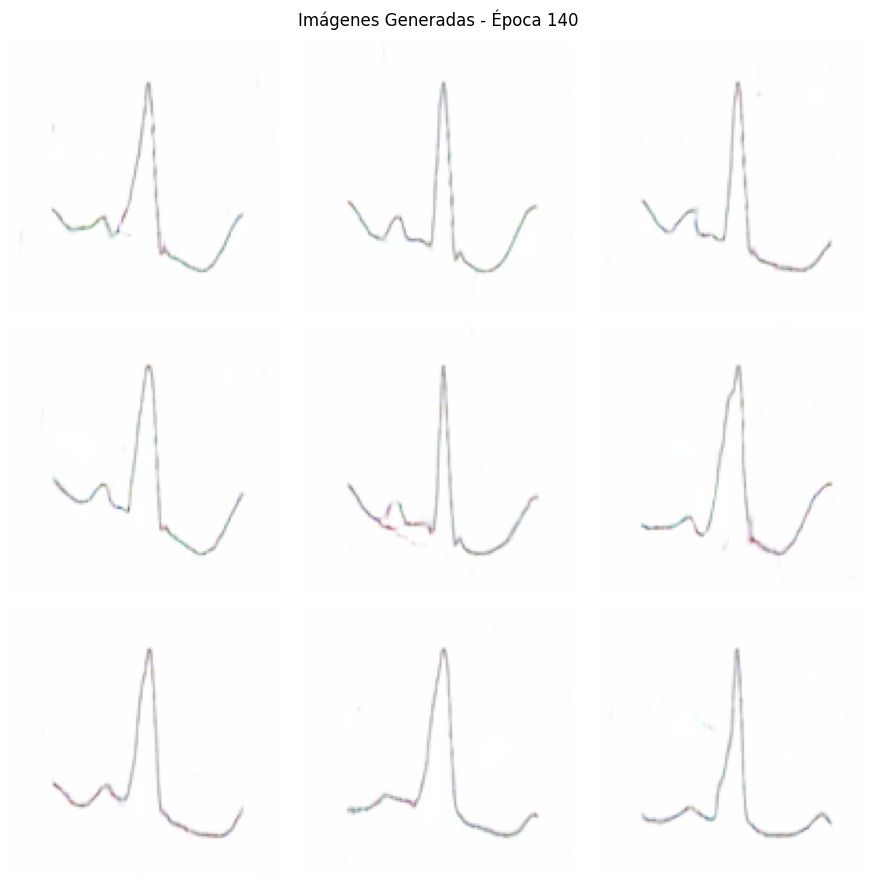

Época 141/150: 100%|██████████| 14/14 [01:23<00:00,  5.99s/it, D_loss=0.2595, G_loss=2.7755]


Época 141/150 - D loss: 0.2804 - G loss: 2.3671


Época 142/150: 100%|██████████| 14/14 [01:23<00:00,  6.00s/it, D_loss=0.2806, G_loss=3.6199]


Época 142/150 - D loss: 0.2343 - G loss: 2.4896


Época 143/150: 100%|██████████| 14/14 [01:23<00:00,  6.00s/it, D_loss=0.3996, G_loss=1.3302]


Época 143/150 - D loss: 0.2748 - G loss: 2.2897


Época 144/150: 100%|██████████| 14/14 [01:27<00:00,  6.26s/it, D_loss=0.1638, G_loss=3.0201]


Época 144/150 - D loss: 0.2621 - G loss: 2.7232


Época 145/150: 100%|██████████| 14/14 [01:29<00:00,  6.38s/it, D_loss=0.1624, G_loss=2.6111]


Época 145/150 - D loss: 0.2308 - G loss: 2.3086


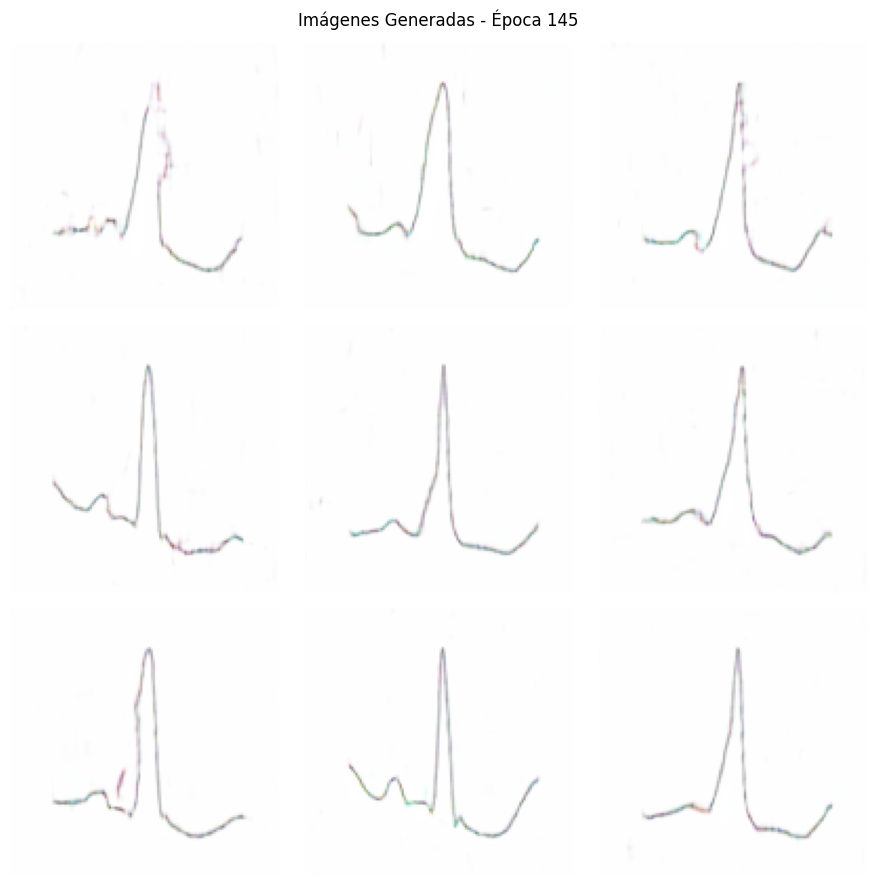

Época 146/150: 100%|██████████| 14/14 [01:54<00:00,  8.21s/it, D_loss=0.2159, G_loss=2.4513]


Época 146/150 - D loss: 0.2288 - G loss: 2.7925


Época 147/150: 100%|██████████| 14/14 [01:29<00:00,  6.43s/it, D_loss=0.2290, G_loss=1.5191]


Época 147/150 - D loss: 0.2930 - G loss: 2.9289


Época 148/150: 100%|██████████| 14/14 [01:21<00:00,  5.81s/it, D_loss=0.1790, G_loss=3.2698]


Época 148/150 - D loss: 0.2137 - G loss: 2.7881


Época 149/150: 100%|██████████| 14/14 [01:23<00:00,  5.99s/it, D_loss=0.1109, G_loss=3.0684]


Época 149/150 - D loss: 0.1989 - G loss: 2.9114


Época 150/150: 100%|██████████| 14/14 [01:25<00:00,  6.10s/it, D_loss=0.1845, G_loss=2.3998]


Época 150/150 - D loss: 0.3086 - G loss: 3.1692


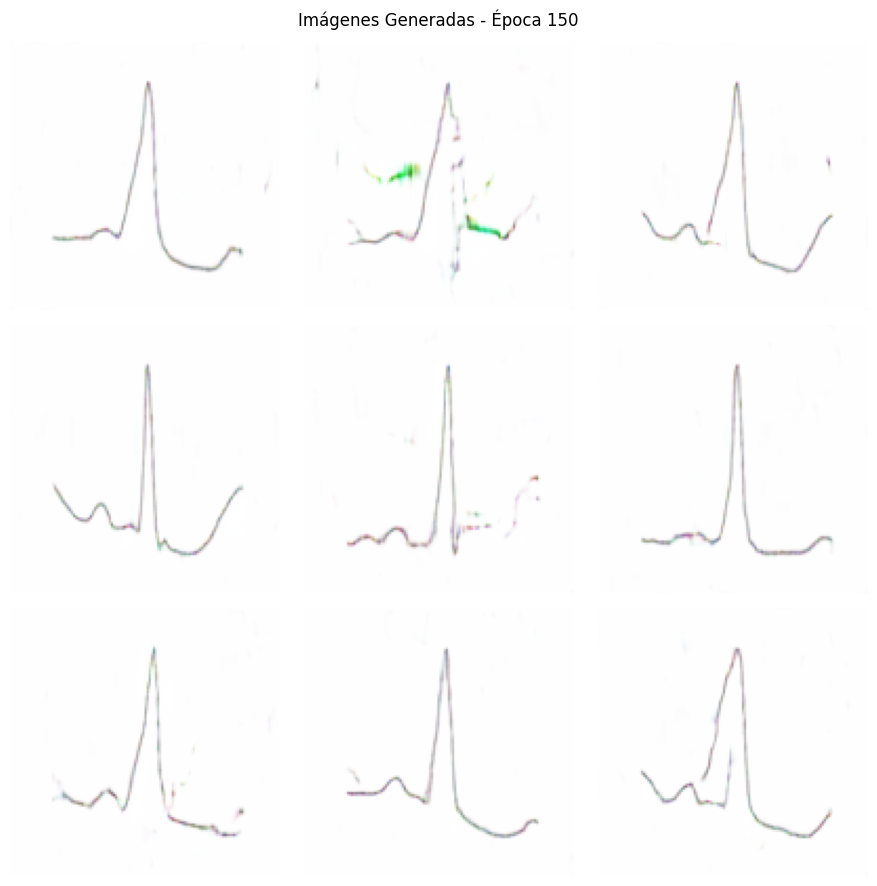

7. Generando 1500 imágenes finales...
Generando 1500 imágenes de prueba...


100%|██████████| 1500/1500 [01:00<00:00, 24.64it/s]


Guardando 1500 imágenes de prueba...


Guardando: 100%|██████████| 1500/1500 [00:01<00:00, 998.37it/s] 


Imágenes guardadas en final_generated_images/


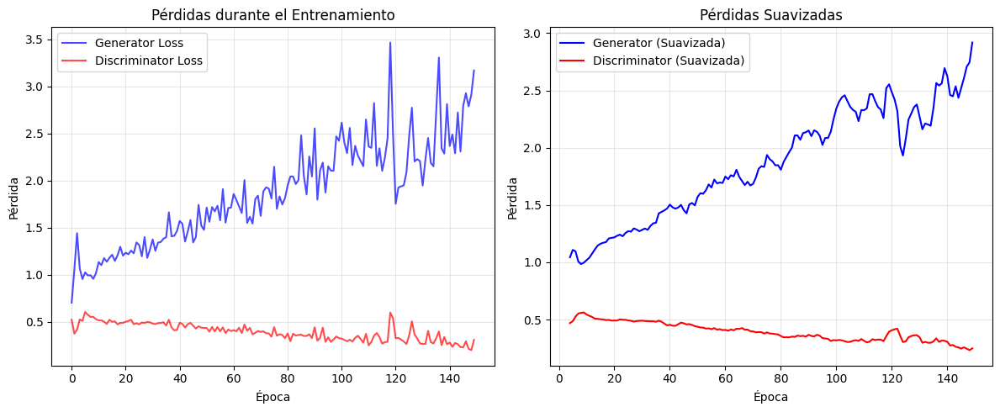

ENTRENAMIENTO COMPLETO FINALIZADO!

9. Mostrando comparación de resultados...


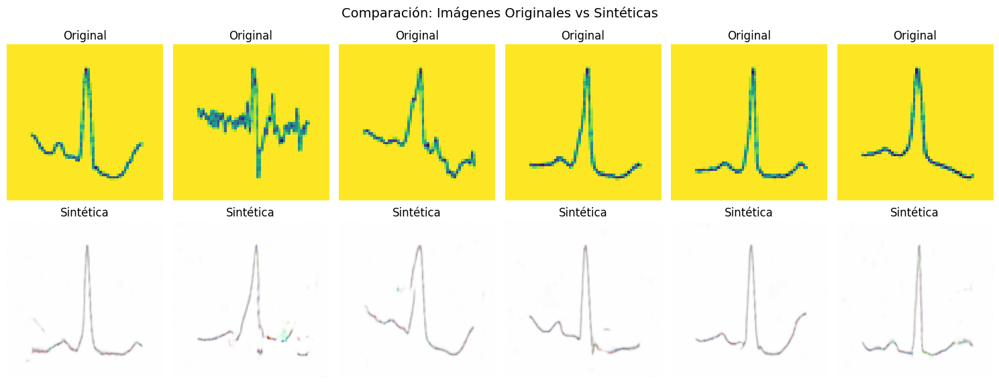

(<__main__.FullGANTrainer at 0x128a6e9d0>,
 [array([[[252, 250, 252],
          [253, 253, 254],
          [254, 254, 254],
          ...,
          [254, 254, 254],
          [254, 254, 254],
          [254, 253, 253]],
  
         [[254, 254, 254],
          [254, 254, 254],
          [254, 254, 254],
          ...,
          [254, 254, 254],
          [254, 254, 254],
          [254, 254, 254]],
  
         [[254, 254, 254],
          [254, 254, 254],
          [254, 254, 254],
          ...,
          [254, 254, 254],
          [254, 254, 254],
          [254, 254, 254]],
  
         ...,
  
         [[254, 254, 254],
          [254, 254, 254],
          [254, 254, 254],
          ...,
          [254, 254, 254],
          [254, 254, 254],
          [254, 254, 254]],
  
         [[254, 254, 254],
          [254, 254, 254],
          [254, 254, 254],
          ...,
          [254, 254, 254],
          [254, 254, 254],
          [254, 254, 254]],
  
         [[252, 252, 251],
        

In [12]:
def scale_up_training(execute=False):
    """
    Configuración recomendada después de que la prueba funcione bien
    
    Args:
        execute (bool): Si True, ejecuta el entrenamiento completo con la nueva configuración
    """
    config = {
        'DATA_PATH': "ecg_img/train",  # Tu ruta
        'IMG_SIZE': 128,           # Tamaño completo
        'EPOCHS': 150,             # Más épocas para mejor calidad
        'BATCH_SIZE': 32,          # Batch más grande
        'LATENT_DIM': 100,         # Dimensión completa
        'SAMPLE_SIZE': None,       # Todo el dataset (sin límite)
        'LR': 0.0002,             # Learning rate estándar para GANs
        'N_GENERATED': 1500        # Más imágenes para balanceamiento real
    }
    
    print("CONFIGURACIÓN RECOMENDADA PARA ENTRENAMIENTO COMPLETO:")
    print("-" * 60)
    for key, value in config.items():
        print(f"  {key}: {value}")
    print("-" * 60)
    
    if not execute:
        print("Para ejecutar con esta configuración, llama:")
        print("scale_up_training(execute=True)")
        return config
    
    # EJECUTAR ENTRENAMIENTO COMPLETO
    print("INICIANDO ENTRENAMIENTO COMPLETO...")
    
    # 1. Cargar dataset completo (sin límite de muestra)
    print("1. Cargando dataset completo...")
    image_paths, labels = load_ecg_dataset_complete(config['DATA_PATH'])
    
    if len(image_paths) == 0:
        print("Error: No se pudieron cargar imágenes.")
        return
    
    # 2. Dividir dataset
    print("2. Dividiendo dataset 70/30...")
    X_train, X_test, y_train, y_test = split_dataset_70_30(image_paths, labels)
    
    # 3. Crear transformaciones para tamaño completo
    transform = transforms.Compose([
        transforms.Resize((config['IMG_SIZE'], config['IMG_SIZE'])),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])
    
    # 4. Crear dataset y dataloader
    train_dataset = ECGDataset(X_train, y_train, transform=transform, target_class='F')
    train_dataloader = DataLoader(
        train_dataset, 
        batch_size=config['BATCH_SIZE'], 
        shuffle=True, 
        drop_last=True
    )
    
    print(f"Dataset de entrenamiento: {len(train_dataset)} imágenes")
    print(f"Número de batches: {len(train_dataloader)}")
    
    # 5. Crear modelos con configuración completa
    print("5. Inicializando GAN para entrenamiento completo...")
    trainer = FullGANTrainer(
        latent_dim=config['LATENT_DIM'], 
        img_size=config['IMG_SIZE'], 
        lr=config['LR']
    )
    
    # 6. Entrenar
    print(f"6. Entrenando por {config['EPOCHS']} épocas...")
    trainer.train(train_dataloader, epochs=config['EPOCHS'])
    
    # 7. Generar imágenes finales
    print(f"7. Generando {config['N_GENERATED']} imágenes finales...")
    synthetic_images = trainer.generate_test_images(config['N_GENERATED'])
    
    # 8. Guardar resultados
    save_test_images(synthetic_images, 'final_generated_images')
    trainer.plot_training_losses()
    
    print("ENTRENAMIENTO COMPLETO FINALIZADO!")

    # 9. Mostrando comparación de resultados
    print("\n9. Mostrando comparación de resultados...")
    show_results_comparison(X_test[:6], synthetic_images[:6])
    
    return trainer, synthetic_images, config

def load_ecg_dataset_complete(data_path):
    """Carga el dataset completo sin límite de muestras"""
    image_paths = []
    labels = []
    
    class_name = 'F'
    class_dir = os.path.join(data_path, class_name)
    
    if os.path.exists(class_dir):
        print(f"Cargando TODAS las imágenes de clase {class_name}...")
        for filename in os.listdir(class_dir):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                full_path = os.path.join(class_dir, filename)
                image_paths.append(full_path)
        
        labels.extend([class_name] * len(image_paths))
        print(f"  Cargadas {len(image_paths)} imágenes (dataset completo)")
    
    return image_paths, labels

class FullGANTrainer(FastGANTrainer):
    """Versión extendida del trainer para entrenamiento completo"""
    
    def __init__(self, latent_dim=100, img_size=128, lr=0.0002, b1=0.5, b2=0.999):
        # Usar generador y discriminador más grandes
        self.latent_dim = latent_dim
        self.img_size = img_size
        
        # Modelos más grandes para mejor calidad
        self.generator = FullGenerator(latent_dim, 3, img_size).to(device)
        self.discriminator = FullDiscriminator(3, img_size).to(device)
        
        # Optimizadores con LR estándar
        self.optimizer_G = optim.Adam(self.generator.parameters(), lr=lr, betas=(b1, b2))
        self.optimizer_D = optim.Adam(self.discriminator.parameters(), lr=lr, betas=(b1, b2))
        
        self.adversarial_loss = nn.BCELoss()
        self.g_losses = []
        self.d_losses = []

class FullGenerator(nn.Module):
    """Generador más grande para mejor calidad"""
    def __init__(self, latent_dim=100, img_channels=3, img_size=128):
        super(FullGenerator, self).__init__()
        self.img_size = img_size
        self.img_channels = img_channels
        
        self.init_size = img_size // 8  # 16x16 para img_size=128
        self.l1 = nn.Sequential(nn.Linear(latent_dim, 256 * self.init_size ** 2))
        
        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(256),
            nn.Upsample(scale_factor=2),  # 32x32
            nn.Conv2d(256, 256, 3, stride=1, padding=1),
            nn.BatchNorm2d(256, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),  # 64x64
            nn.Conv2d(256, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),  # 128x128
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, img_channels, 3, stride=1, padding=1),
            nn.Tanh(),
        )
    
    def forward(self, z):
        out = self.l1(z)
        out = out.view(out.shape[0], 256, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

class FullDiscriminator(nn.Module):
    """Discriminador más grande para mejor calidad"""
    def __init__(self, img_channels=3, img_size=128):
        super(FullDiscriminator, self).__init__()
        
        def discriminator_block(in_filters, out_filters, bn=True):
            block = [nn.Conv2d(in_filters, out_filters, 3, 2, 1), nn.LeakyReLU(0.2, inplace=True)]
            if bn:
                block.append(nn.BatchNorm2d(out_filters, 0.8))
            return block
        
        self.model = nn.Sequential(
            *discriminator_block(img_channels, 64, bn=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
        )
        
        ds_size = img_size // 2 ** 4  # 4 capas de downsampling
        self.adv_layer = nn.Sequential(nn.Linear(512 * ds_size ** 2, 1), nn.Sigmoid())
    
    def forward(self, img):
        out = self.model(img)
        out = out.view(out.shape[0], -1)
        validity = self.adv_layer(out)
        return validity
    

print("\n🔥 EJECUTANDO ENTRENAMIENTO COMPLETO DIRECTAMENTE...")
scale_up_training(execute=True)